<a href="https://colab.research.google.com/github/Rohit-Saswadkar/Omdena-Tuberculosis-Analysis-in-Kaduna/blob/main/Omdena_Kaduna_Model_block_1a_Analysis_Kaduna_Nigeria.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Tuberculosis Analysis and Prediction Model Building for Kaduna, Nigeria**

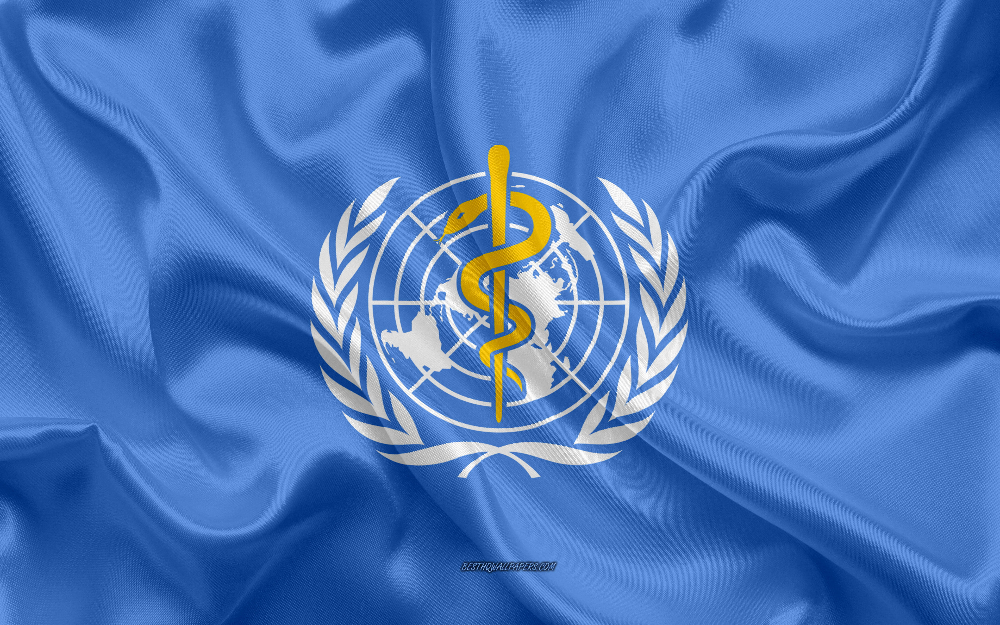

* Author - Rohit Saswadkar
* Linkedin - https://linkedin.com/in/rohit-saswadkar-595453237
* Github - https://github.com/Rohit-Saswadkar

##**Problem Statement**

**Problem:** Tuberculosis (TB) is a major public health concern in Nigeria, particularly in Kaduna. This project aims to analyze historical data and predict future TB cases in the region.

**Data:** I will use a dataset containing information on TB cases in Kaduna from 2019 to 2023, including details like total cases, drug resistance, HIV co-infection, and healthcare worker (HCW) cases.

**Methods:**

* **Data Exploration:** Analyze trends in TB cases over time, identify patterns, and clean/pre-process data.
* **Regression Modeling:** Develop and evaluate a regression model to predict future TB cases using the provided features. Explore various regression techniques during model selection.
* **Prediction and Insights:** Use the chosen model to predict future cases, identify influential factors within the existing features, and generate recommendations for TB control strategies.

**Tools:** Python, pandas, NumPy, scikit-learn (machine learning), Matplotlib/Seaborn (visualization).

**Timeline:** 6 weeks (data exploration, model selection, training/evaluation, prediction, reporting).

**Deliverables:**

* Project report outlining methodology, findings, and recommendations.
* Trained and documented regression model for future TB case prediction.
* Key visualizations summarizing data analysis and model performance.

This even more concise version removes the mention of feature engineering and specific model names while keeping the core elements of the project description.

##***1] Importing Required Libraries***

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# import important libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import SelectKBest , f_regression

# get important ML libraries

from sklearn.ensemble import GradientBoostingRegressor , RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score , mean_absolute_error  ,mean_squared_error
from sklearn.model_selection import GridSearchCV

from sklearn.linear_model import Ridge , Lasso , ElasticNet
from scipy.stats import boxcox
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV , KFold
from sklearn.metrics import mean_squared_error, r2_score
from joblib import dump , load
import warnings
import pickle as pkl


##***2] Loading Dataset***

In [ ]:
# load the data
path = '/content/drive/MyDrive/Omdena/My Contribution/Model'
df = pd.read_csv(path + '/Kaduna_block1a_Nigeria_2014_2023.csv')

In [ ]:
df.shape

(828, 23)

In [ ]:
df.describe()

,Unnamed: 0,Year,Quarter,Total number of presumptives,Total examined with Xpert,Total examined with Truenat,Total examined with AFB,Total examined with TB LAMP,Total examined with LF-LAM and others,Screened with X-ray,...,Smear positive,TB LAMP positive,LF LAM positive,Chest X-ray suggestive,Other Clinical Diagnosis,Total diagnosed,Rifampicin resistant,HIV positive,HIV unknown,Presumptives that are HCWs
count,828.000000,828.000000,828.000000,828.000000,828.000000,828.000000,828.000000,828.000000,828.000000,828.000000,...,828.000000,828.000000,828.000000,828.000000,828.000000,828.000000,828.000000,828.000000,828.000000,828.000000
mean,414.388889,2018.277778,2.388889,1577.301932,1381.057971,90.171498,187.038647,6.545894,28.594203,110.408213,...,25.594203,1.019324,9.473430,23.975845,36.978261,137.074879,0.637681,16.678744,353.350242,0.669082
std,239.338621,2.826313,1.113172,1857.611727,1801.403908,327.319267,674.852656,28.789384,147.643807,287.317401,...,60.730216,4.040857,29.808953,49.926131,124.229366,175.198824,1.509063,36.382300,1026.625475,8.566076
min,0.000000,2014.000000,1.000000,28.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,9.000000,0.000000,0.000000,0.000000,0.000000
25%,207.750000,2016.000000,1.000000,340.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,28.000000,0.000000,0.000000,0.000000,0.000000
50%,414.500000,2018.500000,2.000000,827.500000,672.000000,0.000000,0.000000,0.000000,0.000000,23.500000,...,2.000000,0.000000,0.000000,4.000000,0.000000,61.500000,0.000000,4.000000,0.000000,0.000000
75%,621.250000,2021.000000,3.000000,2020.000000,1817.000000,16.000000,80.000000,0.000000,0.000000,119.000000,...,18.000000,0.000000,4.000000,24.000000,10.000000,174.000000,0.000000,14.000000,200.000000,0.000000
max,828.000000,2023.000000,4.000000,11513.000000,10368.000000,2978.000000,7312.000000,295.000000,1695.000000,3549.000000,...,407.000000,32.000000,317.000000,317.000000,993.000000,1022.000000,11.000000,309.000000,9373.000000,169.000000


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 828 entries, 0 to 827
Data columns (total 23 columns):
 #   Column                                 Non-Null Count  Dtype 
---  ------                                 --------------  ----- 
 0   Unnamed: 0                             828 non-null    int64 
 1   Year                                   828 non-null    int64 
 2   Quarter                                828 non-null    int64 
 3   LGA                                    828 non-null    object
 4   Total number of presumptives           828 non-null    int64 
 5   Total examined with Xpert              828 non-null    int64 
 6   Total examined with Truenat            828 non-null    int64 
 7   Total examined with AFB                828 non-null    int64 
 8   Total examined with TB LAMP            828 non-null    int64 
 9   Total examined with LF-LAM and others  828 non-null    int64 
 10  Screened with X-ray                    828 non-null    int64 
 11  Truenat positive   

##***3] Lets check values of the data***

In [ ]:
def uniques():
  print("Unique values in the columns:")
  for i, col in enumerate(df.columns):
    print(f'{i}: {col}:',df[col].nunique())
uniques()

Unique values in the columns:
0: Unnamed: 0: 828
1: Year: 10
2: Quarter: 4
3: LGA: 23
4: Total number of presumptives: 385
5: Total examined with Xpert: 203
6: Total examined with Truenat: 99
7: Total examined with AFB: 90
8: Total examined with TB LAMP: 23
9: Total examined with LF-LAM and others: 45
10: Screened with X-ray: 136
11: Truenat positive: 37
12: Smear positive: 68
13: TB LAMP positive: 14
14: LF LAM positive: 58
15: Chest X-ray suggestive: 58
16: Other Clinical Diagnosis: 65
17: Total diagnosed: 211
18: Rifampicin resistant: 11
19: HIV positive: 72
20: HIV unknown: 140
21: Presumptives that are HCWs: 10
22: YEAR QUARTER: 21


In [ ]:
# get uniques of lga
df['LGA'].value_counts()

LGA
Birnin-Gwari    36
Kaura           36
Zango-Kataf     36
Soba            36
Sanga           36
Sabon-Gari      36
Markafi         36
Lere            36
Kudan           36
Kubau           36
Kauru           36
Kajuru          36
Chikun          36
Kagarko         36
Kaduna South    36
Kaduna North    36
Kachia          36
Jema'a          36
Jaba            36
Ikara           36
Igabi           36
Giwa            36
Zaria           36
Name: count, dtype: int64

In [ ]:
df['YEAR QUARTER']

0      2014 Q1
1      2014 Q1
2      2014 Q1
3      2014 Q1
4      2014 Q1
        ...   
823    2023 Q2
824    2023 Q2
825    2023 Q2
826    2023 Q2
827    2023 Q2
Name: YEAR QUARTER, Length: 828, dtype: object

In [ ]:
# LGA are in upper and lower case so replace them with upper
df['LGA'] = df['LGA'].str.upper()
df['LGA'].nunique()

23

In [ ]:
df.rename(columns = {'YEAR QUARTER':'Year_Quarter'}, inplace = True)

**Challenge: I have only 413 rows of data**

**Presumptive DR TB has object vaue as True then replace with 1**

In [ ]:
# Replace TRUE to 1 all over the df as its typing mistake
# convert the numeric string columns to numeric format
df.replace('TRUE' , 1 , inplace = True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 828 entries, 0 to 827
Data columns (total 23 columns):
 #   Column                                 Non-Null Count  Dtype 
---  ------                                 --------------  ----- 
 0   Unnamed: 0                             828 non-null    int64 
 1   Year                                   828 non-null    int64 
 2   Quarter                                828 non-null    int64 
 3   LGA                                    828 non-null    object
 4   Total number of presumptives           828 non-null    int64 
 5   Total examined with Xpert              828 non-null    int64 
 6   Total examined with Truenat            828 non-null    int64 
 7   Total examined with AFB                828 non-null    int64 
 8   Total examined with TB LAMP            828 non-null    int64 
 9   Total examined with LF-LAM and others  828 non-null    int64 
 10  Screened with X-ray                    828 non-null    int64 
 11  Truenat positive   

**Are there any null values?**

In [ ]:
# check null counts
df.isnull().sum()

Unnamed: 0                               0
Year                                     0
Quarter                                  0
LGA                                      0
Total number of presumptives             0
Total examined with Xpert                0
Total examined with Truenat              0
Total examined with AFB                  0
Total examined with TB LAMP              0
Total examined with LF-LAM and others    0
Screened with X-ray                      0
Truenat positive                         0
Smear positive                           0
TB LAMP positive                         0
LF LAM positive                          0
Chest X-ray suggestive                   0
Other Clinical Diagnosis                 0
Total diagnosed                          0
Rifampicin resistant                     0
HIV positive                             0
HIV unknown                              0
Presumptives that are HCWs               0
Year_Quarter                             0
dtype: int6

In [ ]:
# There is unnecessary column as Unnamed so droped it.
# df.drop('Unnamed: 0',axis=1,inplace=True)

In [ ]:
df.duplicated().sum()

0

In [ ]:
df.head()

,Unnamed: 0,Year,Quarter,LGA,Total number of presumptives,Total examined with Xpert,Total examined with Truenat,Total examined with AFB,Total examined with TB LAMP,Total examined with LF-LAM and others,...,TB LAMP positive,LF LAM positive,Chest X-ray suggestive,Other Clinical Diagnosis,Total diagnosed,Rifampicin resistant,HIV positive,HIV unknown,Presumptives that are HCWs,Year_Quarter
0,0,2014,1,BIRNIN-GWARI,58,993,0,24,0,0,...,0,0,6,0,25,0,2,0,0,2014 Q1
1,1,2014,1,CHIKUN,346,673,0,194,0,0,...,0,0,25,0,66,0,99,25,0,2014 Q1
2,2,2014,1,GIWA,201,1045,0,793,0,0,...,0,0,0,46,38,1,16,0,0,2014 Q1
3,3,2014,1,IGABI,261,470,0,745,0,0,...,0,0,32,0,70,3,10,0,0,2014 Q1
4,4,2014,1,IKARA,209,2717,152,618,0,27,...,0,0,0,23,13,0,5,0,0,2014 Q1




### **Conclusion as per above:** 🔎

**460 individuals** were flagged as potential TB cases (presumptive) in the first quarter of 2019 to Second quarter of 2023. Encouragingly, all underwent diagnostic procedures.

**Diagnosis Breakdown:**

* **100% confirmed TB:** All 460 presumptive cases were diagnosed with tuberculosis.

**HIV Status:**

* **Positive:** 123 diagnosed cases were HIV positive.
* **Negative:** 109 diagnosed cases were HIV negative.
* **Unknown:** The HIV status of 15 diagnosed cases remains unknown.

**Important Note:**

While it provides a snapshot of TB cases during that period,  **more data** across different quarters and years would be necessary to identify trends, understand seasonal variations, and for more comprehensive analysis.

**Additional Insights (if data is available):**

* It would be valuable to calculate the percentage of presumptive cases diagnosed with specific TB types (e.g., drug-resistant TB).
* Examining the number of healthcare workers (HCWs) among the presumptive cases could provide insights into potential workplace exposure risks.

This revised summary offers a clearer picture of the TB situation in Q1 2021, acknowledges the limitations of single-period data, and suggests further analysis with additional information.

##***4] Let's Explore the Data and get insights***

**Before EDA Separate the data as per there data types**

In [ ]:
num_cols = [col for col in df.columns if col not in ['Year','Quarter','LGA','Year_Quarter','Rifampicin resistant']]
categorical_cols = ['Year','Quarter','LGA','Year_Quarter','Rifampicin resistant']
len(num_cols) , len(categorical_cols)

(18, 5)

Exploratory Data Analysis Of The Data Set
Why do we perform EDA?

An EDA is a thorough examination meant to uncover the underlying structure of a data set and is important for a company because it exposes trends, patterns, and relationships that are not readily apparent.
Univariate Analysis
Why do you do univariate analysis?

The key objective of Univariate analysis is to simply describe the data to find patterns within the data.
Analysis of Dependent Variable:
What is a dependent variable in data analysis?

we analyse our dependent variable,A dependent variable is a variable whose value will change depending on the value of another variable.
Analysation of categorical variables
Our dependent variable is 'Total Diagnosed' so we need to analysis this column with the other columns by using some visualisation plot.first we analyze the category data type then we proceed with the numerical data type

###**A] Univariate Analysis**

**1] Let's check distribution of the data**

In [ ]:
num_cols_distribution = [col for col in num_cols ]

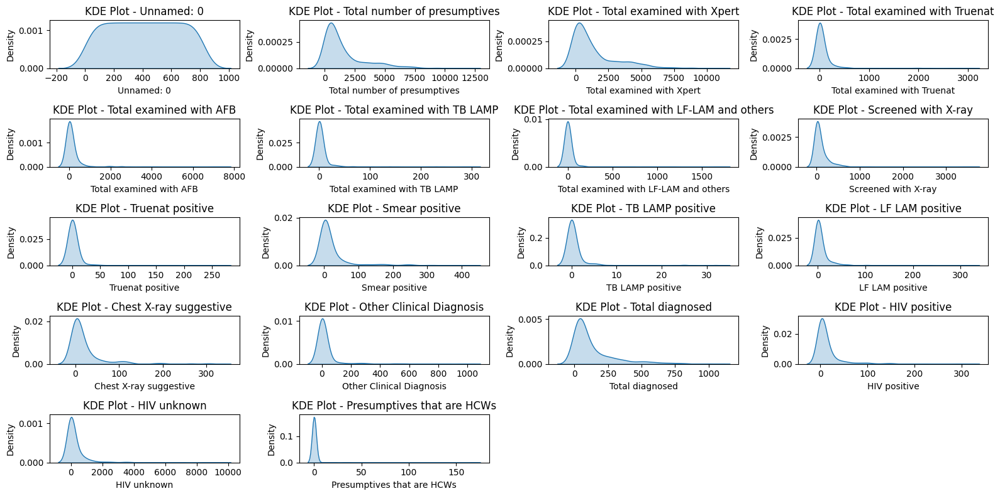

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_kde_plots(df, num_cols):
    num_rows = len(num_cols) // 4 + (len(num_cols) % 4 > 0)  # Calculate number of rows dynamically
    plt.figure(figsize=(16, 8))

    for i, col in enumerate(num_cols, 1):
        plt.subplot(num_rows, 4, i)
        sns.kdeplot(df[col], fill=True)
        plt.title(f'KDE Plot - {col}')
        plt.xlabel(col)

    plt.tight_layout()
    plt.show()

# Assuming 'df' is your DataFrame and 'num_cols_distribution' is the list of numerical columns
plot_kde_plots(df, num_cols_distribution)


**- As per above, our data is not in normal distribution. So I have to do some transformations to convert the data to normal distribution.**



 **- Why Normal Distribution ie required?**

Normal distribution is crucial in statistics because it simplifies calculations, enables statistical inference, and ensures the validity of many statistical tests and modeling techniques. It is essential for parameter estimation, hypothesis testing, and modeling assumptions. Additionally, the Central Limit Theorem relies on the normal distribution, making it fundamental in understanding sample distributions. Overall, normal distribution provides a well-understood framework for quantifying uncertainty and making probabilistic statements about data.

**- Also checking skewness of data gives us that the data is normal distributed or not. If values around zero or equal to zero then we can assume normal distribution**

**Outliers are also affects the skewness of the data**


**2] Boxplots to check outliers**

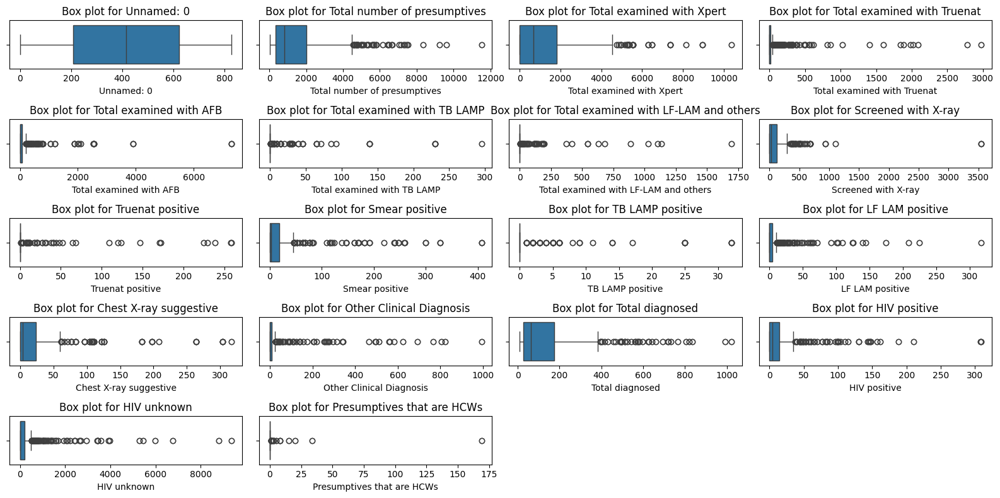

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_box_plots(df, num_cols):
    num_rows = len(num_cols) // 4 + (len(num_cols) % 4 > 0)  # Calculate number of rows dynamically
    plt.figure(figsize=(16, 8))
    for i, col in enumerate(num_cols, 1):
        plt.subplot(num_rows, 4, i)
        sns.boxplot(x=df[col])
        plt.title(f'Box plot for {col}')
        plt.xlabel(col)
    plt.tight_layout()
    plt.show()

plot_box_plots(df, num_cols)


**a] I am counting the number of outliers in my data**

In [ ]:
def outliers_count(col):

  Q1 = df[col].quantile(0.25)
  Q3 = df[col].quantile(0.75)

  IQR = Q3 - Q1

  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR

  Total_outliers = ( df[col] < lower_bound) | ( df[col] > upper_bound)
  print(f" Outliers in {col}:", Total_outliers.sum())
for col in num_cols:
  outliers_count(col)

 Outliers in Unnamed: 0: 0
 Outliers in Total number of presumptives: 84
 Outliers in Total examined with Xpert: 56
 Outliers in Total examined with Truenat: 180
 Outliers in Total examined with AFB: 142
 Outliers in Total examined with TB LAMP: 152
 Outliers in Total examined with LF-LAM and others: 104
 Outliers in Screened with X-ray: 72
 Outliers in Truenat positive: 110
 Outliers in Smear positive: 118
 Outliers in TB LAMP positive: 118
 Outliers in LF LAM positive: 152
 Outliers in Chest X-ray suggestive: 96
 Outliers in Other Clinical Diagnosis: 138
 Outliers in Total diagnosed: 74
 Outliers in HIV positive: 96
 Outliers in HIV unknown: 150
 Outliers in Presumptives that are HCWs: 40


**As per above, there are lots of outliers in our data. But due to limited data instead of removing them I am going to handle them. I am doing transformation after bivariate and multivariate analysis so its easy to interpret the analysis and getting insights from them**

###**B] Bivariate Analysis**

**1] Get Annual Trends in HIV Cases and Healthcare Worker Infections: Insights into Total Diagnosed Cases**

In [ ]:
df.columns

Index(['Unnamed: 0', 'Year', 'Quarter', 'LGA', 'Total number of presumptives',
       'Total examined with Xpert', 'Total examined with Truenat',
       'Total examined with AFB', 'Total examined with TB LAMP',
       'Total examined with LF-LAM and others', 'Screened with X-ray',
       'Truenat positive', 'Smear positive', 'TB LAMP positive',
       'LF LAM positive', 'Chest X-ray suggestive', 'Other Clinical Diagnosis',
       'Total diagnosed', 'Rifampicin resistant', 'HIV positive',
       'HIV unknown', 'Presumptives that are HCWs', 'Year_Quarter'],
      dtype='object')

In [ ]:
hiv_pos_each_year = df.groupby(['Year_Quarter'])[['Total number of presumptives','Total diagnosed','HIV positive','Presumptives that are HCWs']].sum().reset_index()
hiv_pos_each_year

,Year_Quarter,Total number of presumptives,Total diagnosed,HIV positive,Presumptives that are HCWs
0,2014 Q1,36063,4302,1821,171
1,2015 Q1,74295,5873,1352,30
2,2016 Q1,144660,10918,1462,35
3,2017 Q1,242777,21753,1648,40
4,2018 Q1,166907,15909,1555,171
5,2019 Q3,12015,1124,450,1
6,2019 Q4,12349,1172,438,0
7,2020 Q1,11415,1278,368,1
8,2020 Q2,12274,1190,334,2
9,2020 Q3,21649,1493,297,19


**Conclusion**
* In the given dataset, I observed trends in the total number of presumptives, examinations for diagnosis, total diagnosed cases, HIV-positive cases, and the number of presumptives that are healthcare workers (HCWs) across different quarters from 2019 to 2023. Here are some key points:

1. The total number of presumptives and examinations for diagnosis generally increased over the quarters, reaching higher values in 2022 and 2023.

2. The total diagnosed cases showed an increasing trend, with significant spikes in 2021 Q4 and 2022 Q4.

3. The count of HIV-positive cases fluctuated over the quarters, with notable peaks in 2022 Q2 and 2022 Q4.

4. The number of presumptives that are healthcare workers (HCWs) varied across quarters, with higher counts observed in 2020 Q3, 2021 Q4, and 2022 Q2.

5. There are no data available for 2023 Q3 and Q4.

Overall, the dataset reflects dynamic patterns in the healthcare-related variables over time, suggesting potential trends and areas that may require further investigation.

**Lets Visualize the data**

**2] Total TB diagnosed cases by year in Kaduna Region**

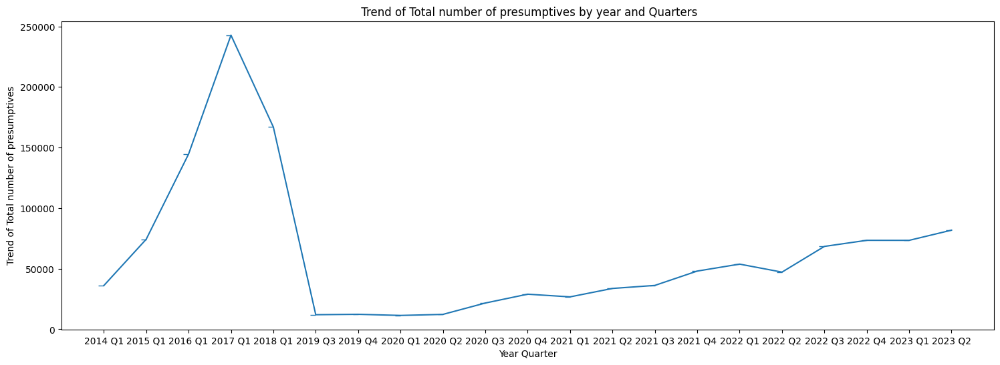

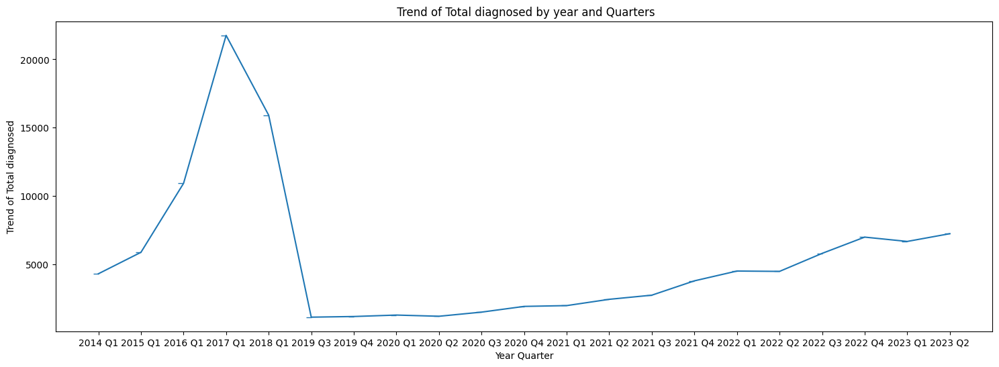

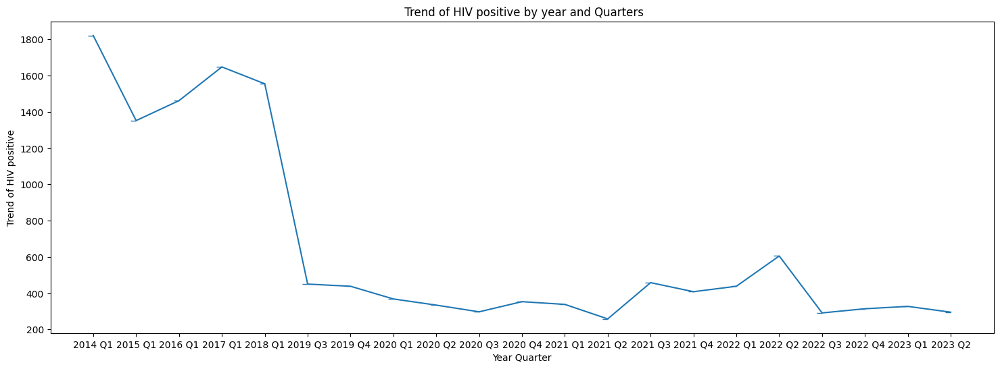

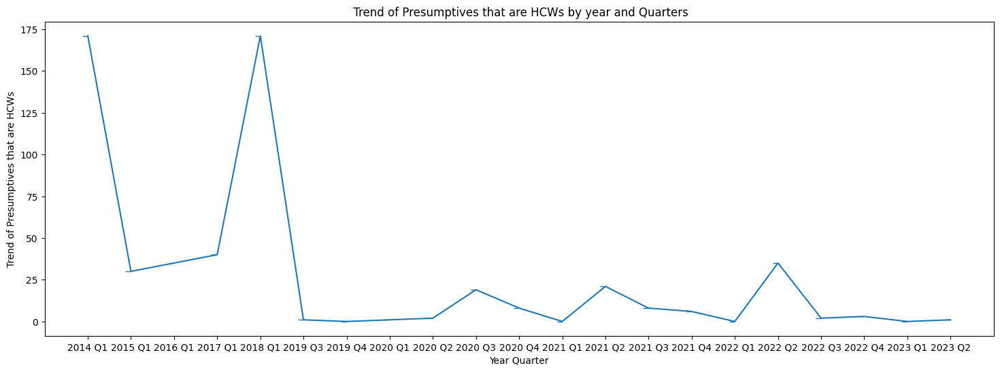

In [ ]:
for col in [col for col in hiv_pos_each_year if col != 'Year_Quarter']:
  plt.figure(figsize=(18,6))
  plt.plot(hiv_pos_each_year['Year_Quarter'].astype(str),hiv_pos_each_year[col],marker = 0,linestyle='-')
  plt.title(f" Trend of {col} by year and Quarters")
  plt.ylabel(f"Trend of {col}")
  plt.xlabel('Year Quarter')
  # plt.grid(True)
  plt.show()

**3] Analyse the numbers of cases in each LGA**

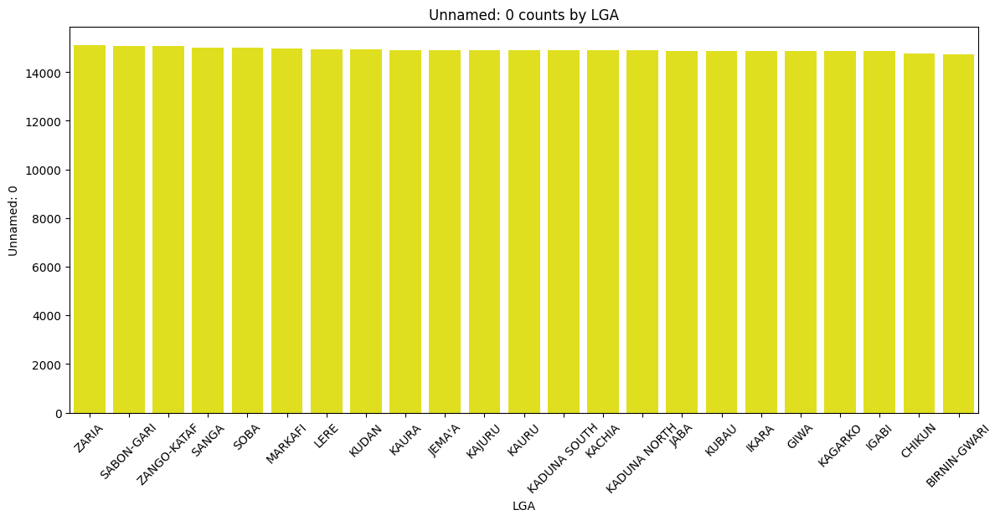

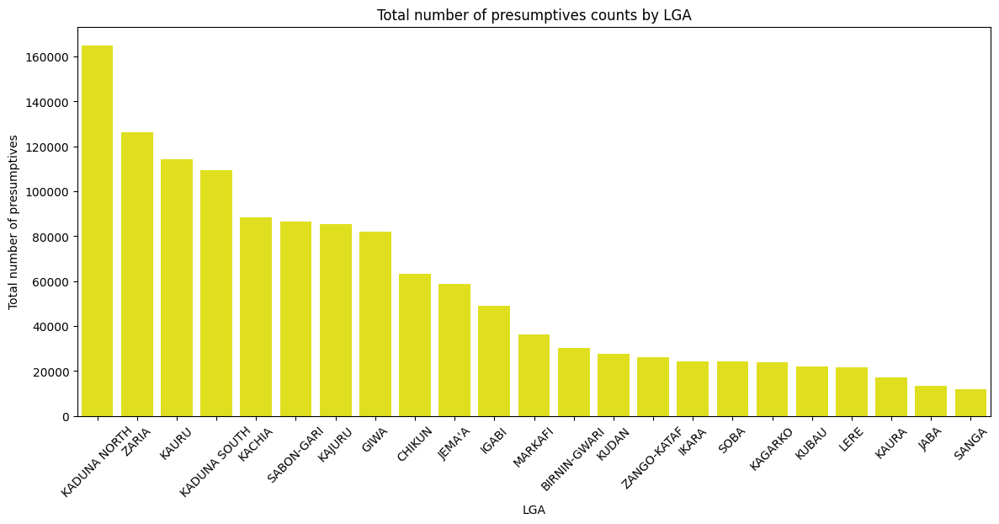

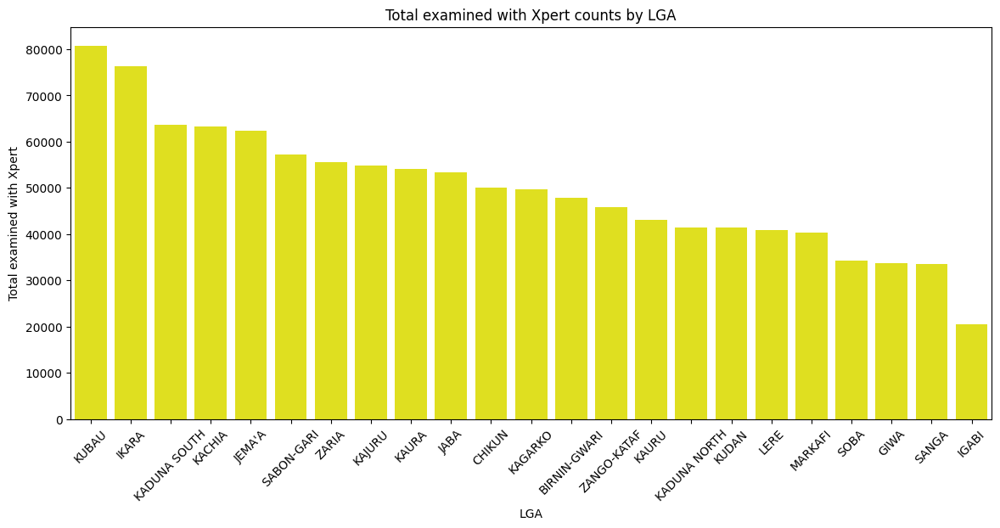

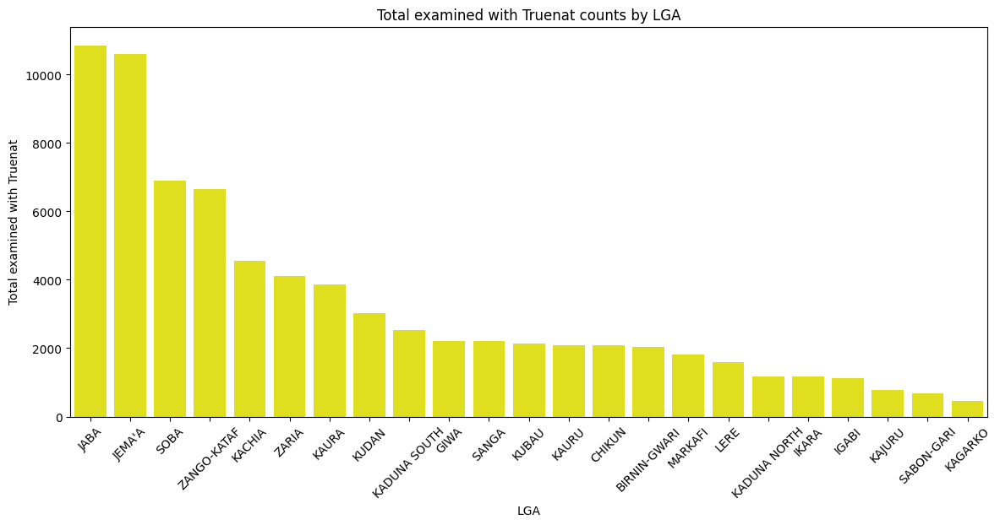

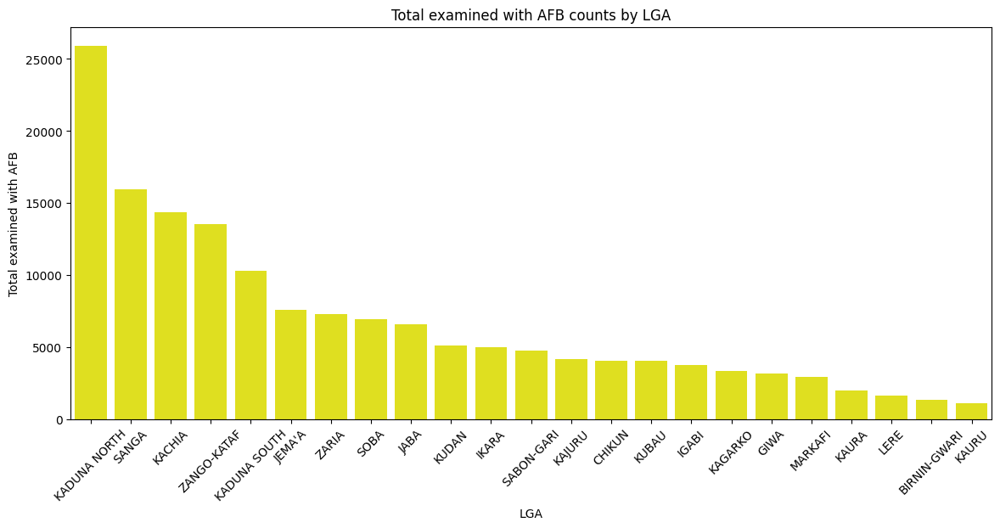

...

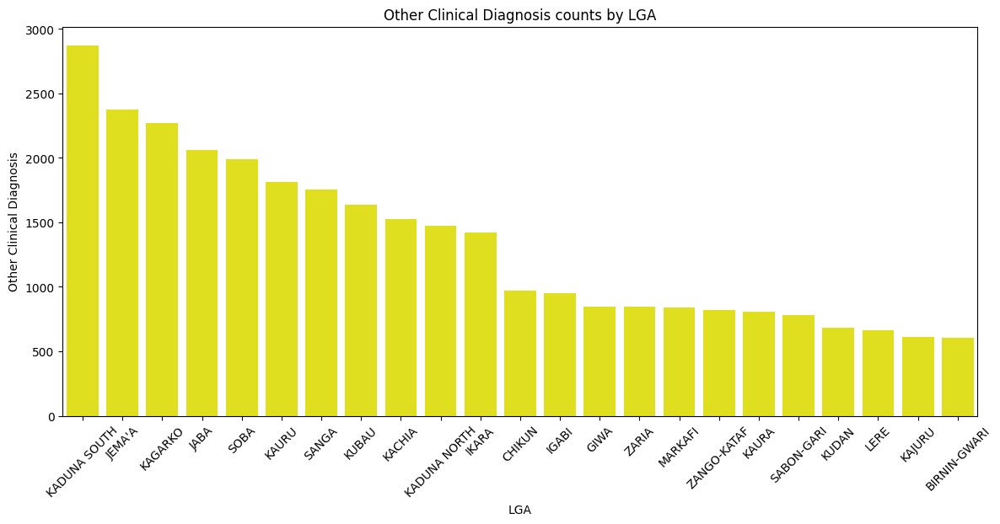

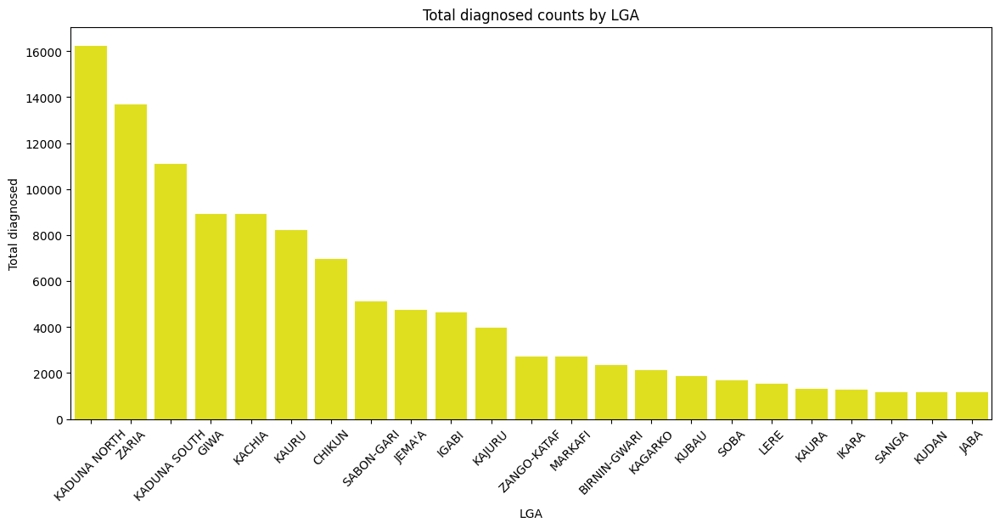

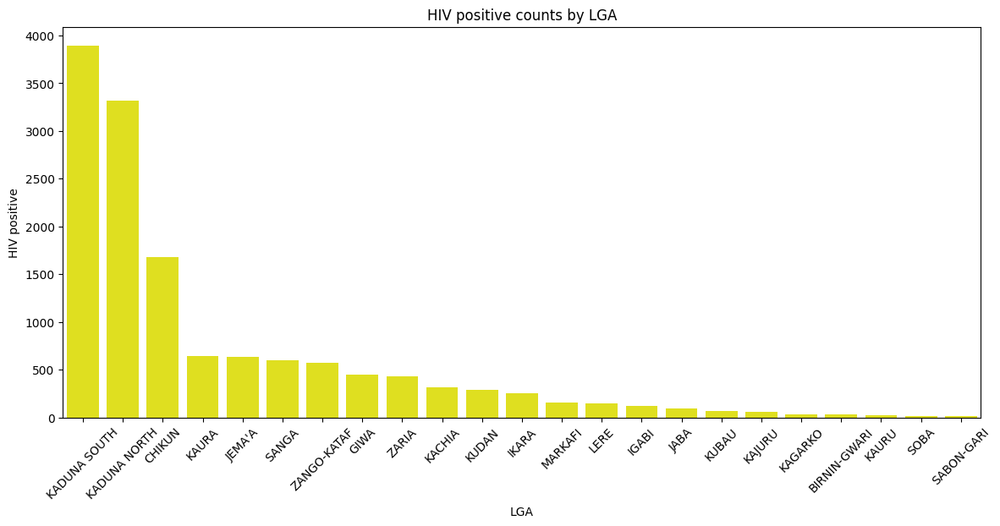

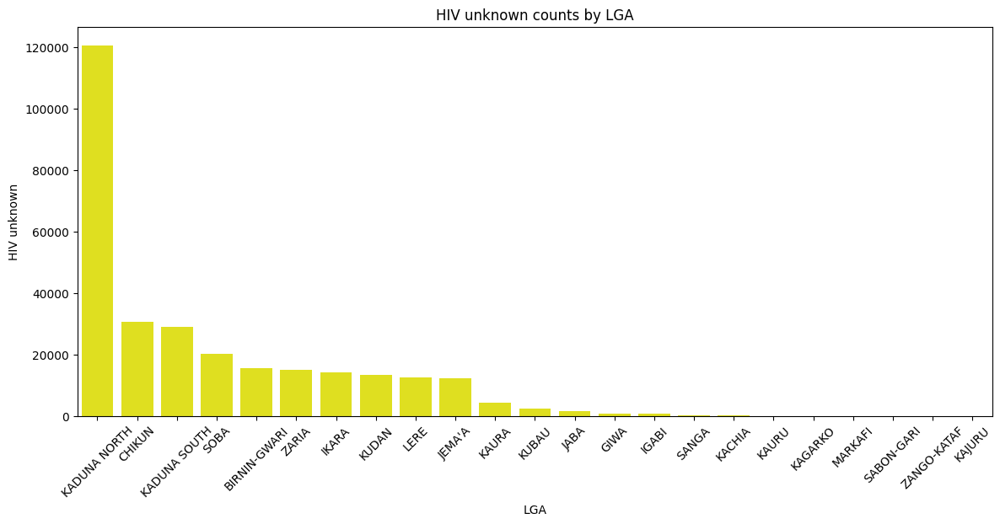

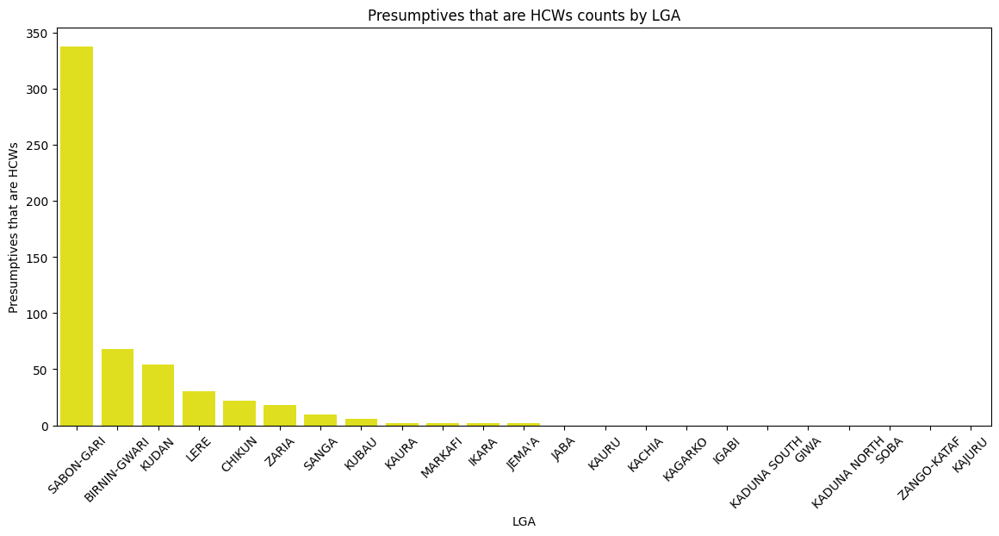

<Figure size 1600x600 with 0 Axes>

<Figure size 1600x600 with 0 Axes>

In [ ]:
plot_cols = [x for x in num_cols if x not in ['Year','Quarter']]
for col in plot_cols:
  plt.figure(figsize=(14,6))
  sns.barplot(x='LGA',y=col,data=df.groupby('LGA').sum(numeric_only = True).reset_index().sort_values(by=col,ascending=False ) , color = 'yellow', legend = False )
  plt.title(f'{col} counts by LGA')
  plt.xticks(rotation=45)
  plt.xlabel("LGA")
  plt.ylabel(col)
  plt.show()

plt.figure(figsize=(16, 6))

**Conclusion:**

1. **Presumptives and Examinations:**
   - **Possible Cause:** Increased public awareness campaigns or targeted testing programs.
   - **Reasoning:** The surge in 2020 Q3 could be a response to a specific health initiative or community outreach.

2. **Total Diagnosed Cases:**
   - **Possible Cause:** Improved diagnostic technologies or expanded testing infrastructure.
   - **Reasoning:** A consistent rise might indicate advancements in testing capabilities, leading to more accurate diagnoses.

3. **HIV Positive Cases:**
   - **Possible Cause:** Disparities in education and limited public awareness.
  - **Reasoning:** The persistent challenges in the education system and lower awareness levels among certain demographics might contribute to higher HIV positive cases. Improving education and launching targeted awareness campaigns could be crucial in addressing this issue.

4. **Healthcare Workers (HCWs):**
   - **Possible Cause:** Occupational exposure or increased health screenings among HCWs.
   - **Reasoning:** The presence of HCWs among presumptives may reflect proactive health monitoring or targeted workplace testing.

These speculative reasons offer insights into potential factors contributing to the observed trends. Further investigation and contextual information would provide a more accurate understanding.

**4] Analyze the trend of each feature by LGA. This analysis is helpful in understanding the impact of features on different LGAs, revealing which areas are more affected by specific features.**

In [ ]:
columns_to_line = [ 'Total number of presumptives', 'Total diagnosed','HIV positive']

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
def line_plot(col):

  grouped_data = df.groupby(['Year_Quarter', 'LGA'])[col].sum().reset_index()

  plt.figure(figsize=(16,6))
  sns.lineplot(x='Year_Quarter', y=col, hue='LGA', data=grouped_data, marker='o' , errorbar = ('ci', False))

  plt.xlabel('Year_Quarter')
  plt.xticks(df['Year_Quarter'])
  plt.ylabel(col)
  plt.title(f'Increase in {col} by LGA and Year_Quarter')
  plt.legend(title='LGA', loc='upper left', bbox_to_anchor=(1, 1))  # Adjust legend position
  plt.show()


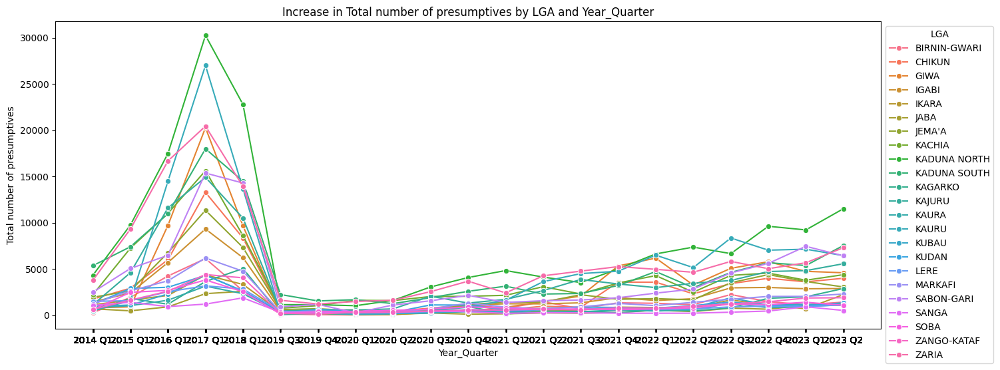

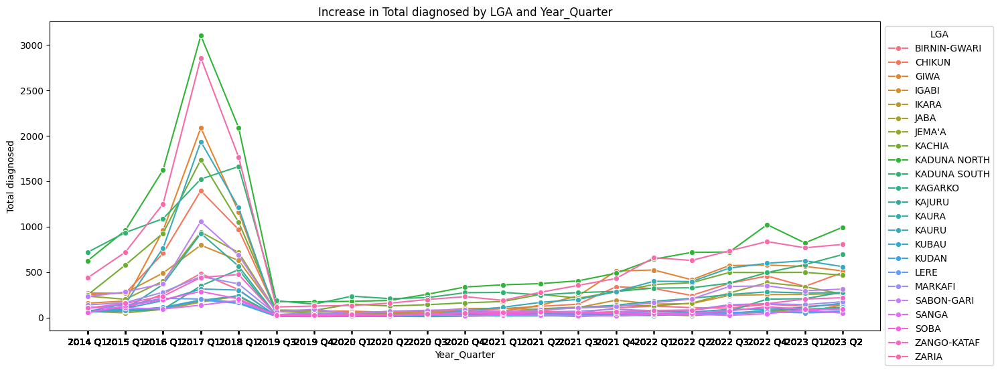

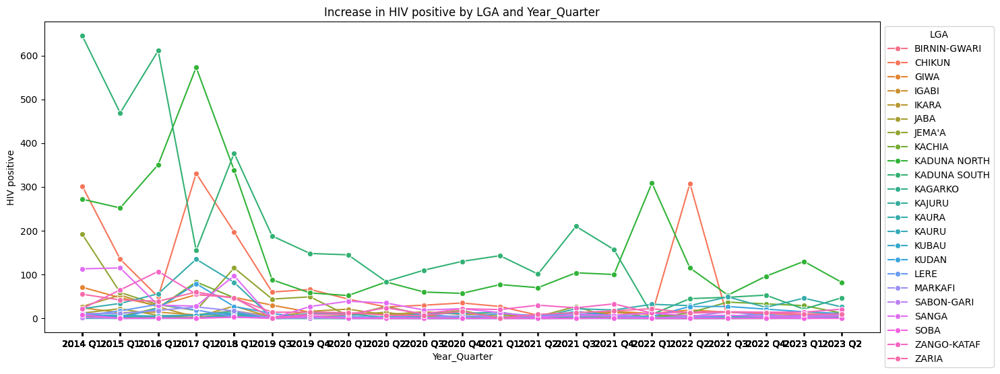

In [ ]:
for col in columns_to_line:
    line_plot(col)

**5] Examine the correlation of each column with the total diagnosed cases.**

In [ ]:
# numerical columns corelation to total diagnosed
columns_for_correlation = ['Total number of presumptives',
       'Rifampicin resistant', 'HIV positive', 'HIV unknown', 'Presumptives that are HCWs']

In [ ]:
# scatter plot for correlation
def scatter_plot(col):
  plt.figure(figsize=(10,6))
  sns.scatterplot(x = col , y='Total diagnosed' , data = df)
  plt.xlabel(col)
  plt.ylabel('Total diagnosed')
  plt.title(f'Correlation of {col} with Total diagnosed')
  plt.show()

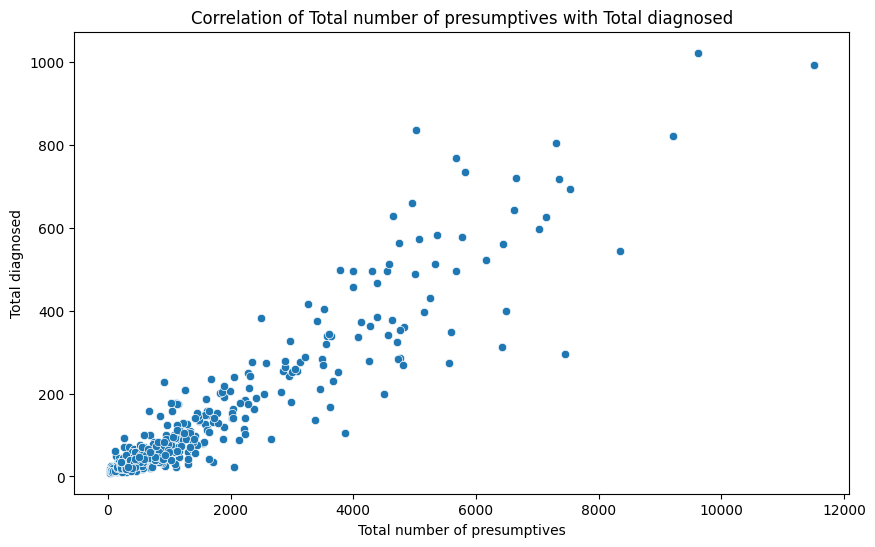

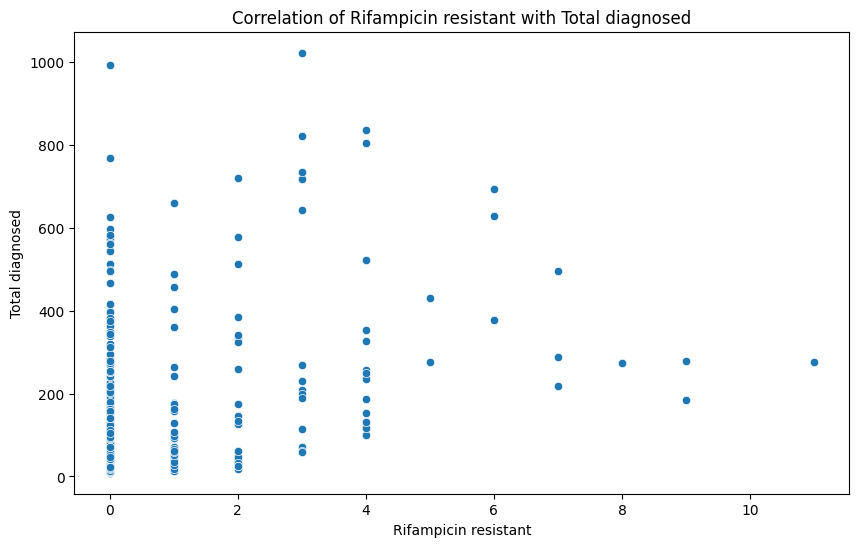

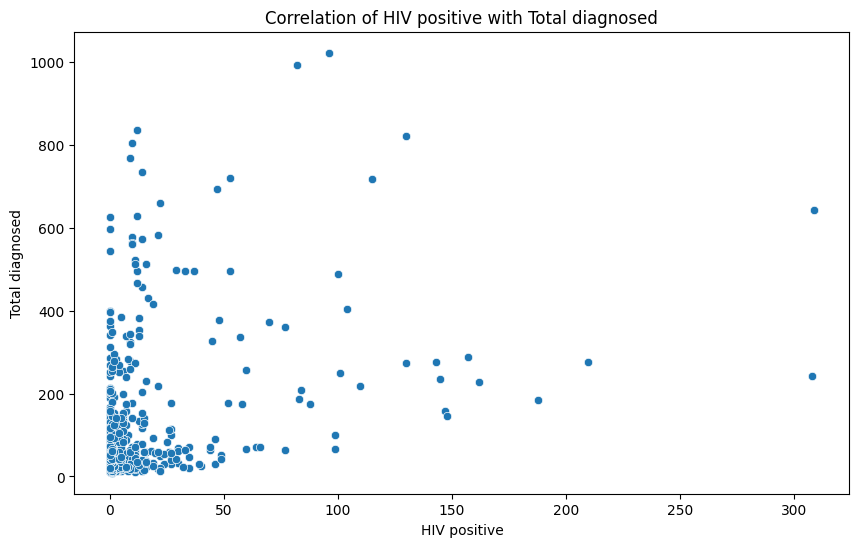

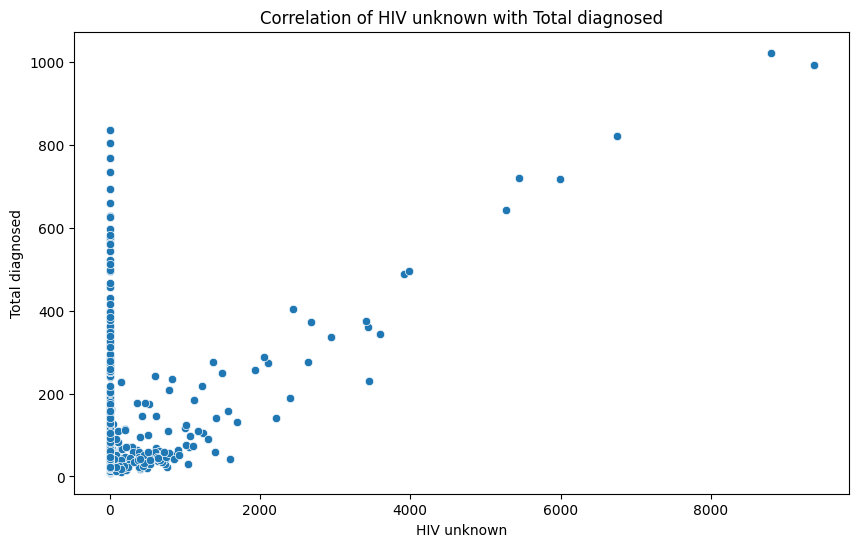

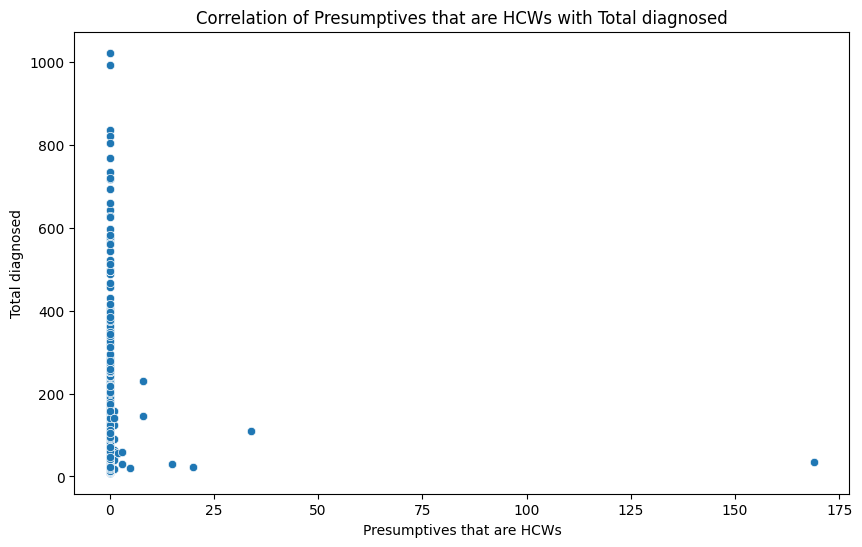

In [ ]:
for col in columns_for_correlation:
  scatter_plot(col)

###**C] Multivariate analysis**

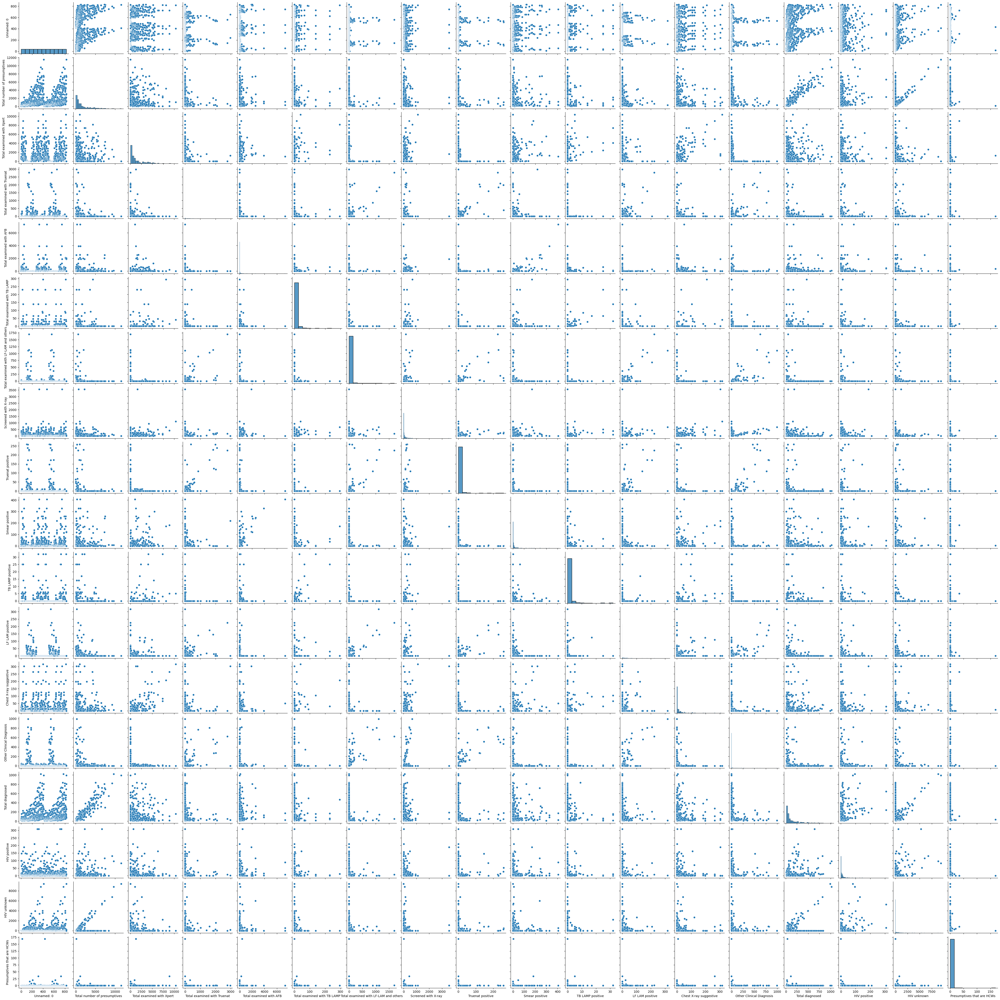

In [ ]:
scatter_plot_cols = [col for col in num_cols if col not in ['Year','Quarter']]
sns.pairplot(df[scatter_plot_cols])
plt.show()

**Conclusion**


**Key Observations:**

* **Geographic Distribution:**  TB cases appear to be concentrated in several LGAs, including Kaduna North, Zaria, Kaduna South, Kachia, Sabon Gari, Kauru, Kajuru, and Giwa.
* **HIV and TB Co-infection:**  HIV positive cases are found more frequently in Kaduna South, Kaduna North, and Chikun, while a high number of unknown HIV cases exist in Kaduna North. This suggests a potential need for integrated TB and HIV control strategies in these areas.
* **Drug-Resistant TB:**  Rifampicin resistance, a marker of DR-TB, is present in Kaduna South, Zaria, and Kaduna North. This highlights the importance of measures to curb the emergence of DR-TB.
* **Diagnosis Rates:**  Kaduna North appears to have a higher number of individuals examined for TB diagnosis, potentially indicating more active screening efforts or higher case burden.

**Overall:**

Kaduna State faces a significant challenge with TB, with variations in prevalence, co-infection rates, and drug resistance across different LGAs.

**Recommendations:**

* Public health efforts should prioritize TB screening, diagnosis, and treatment programs in high-burden LGAs (Kaduna North, Zaria, Kaduna South).
* Interventions to reduce DR-TB should be implemented, focusing on areas with identified Rifampicin resistance cases.
* Integrating TB control with HIV testing and treatment services, particularly in LGAs with high HIV prevalence or unknown HIV status among TB cases, is crucial.
* Strengthening public health education campaigns to raise awareness about TB symptoms and encourage early testing in all LGAs is important.

**Data Considerations:**

* It's important to acknowledge that this analysis is based on your findings from potentially limited data.
* Access to more comprehensive data, including specific timeframes and potentially missing details on other LGAs,  could provide a more complete picture of the situation.

**Further Analysis:**

* If possible, obtain data covering a specific timeframe to analyze trends in TB cases, diagnosis rates, and drug resistance.
* Explore potential risk factors associated with TB in different LGAs (e.g., socioeconomic factors, access to healthcare).

By implementing these recommendations and seeking more comprehensive data, Kaduna State can develop more effective strategies to combat TB and improve public health outcomes for its residents.


###**Normalize the data using transformation**

In [ ]:
# trandformed data using square root transformation
for col in num_cols:
  df[col] = np.sqrt(df[col] ) - 0.01

###**A] Check outliers and distributions after transformation**

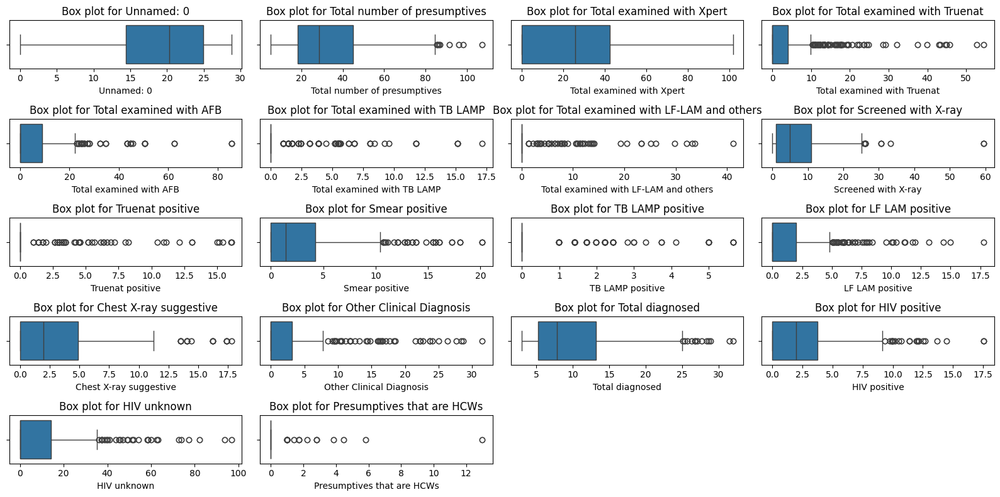

In [ ]:
plot_box_plots(df , num_cols)

**B] Check skeweness and distribution of the data after transformation**

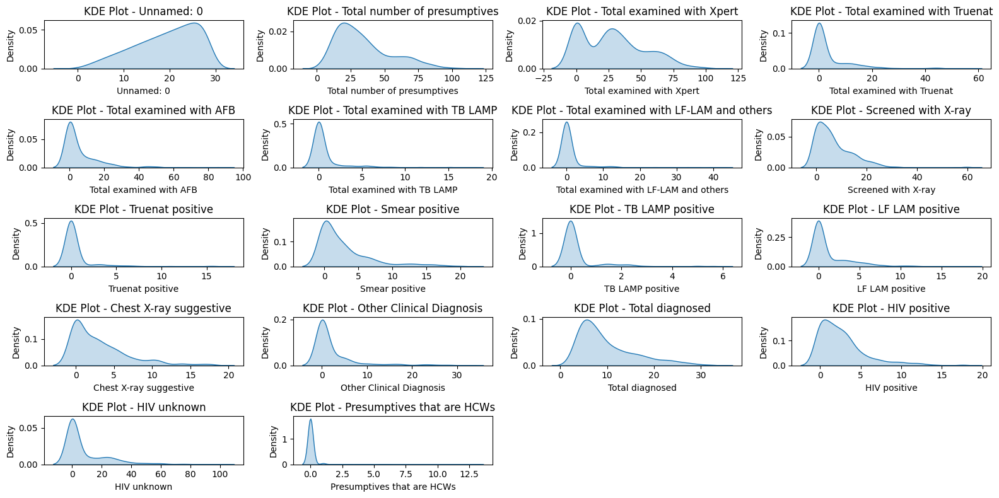

In [ ]:
plot_kde_plots(df , num_cols_distribution)

* There are lots of outliers in data but instead removing them I applied transformations.
* The skewness reduced in better way but not complitely reduced.

**Why I choosed SQRT transform?**
* I tried lots of transformations such as log, box cox, Yeo Johnson transformations Square Root transformation gave better results among all.

##**5] Data Processing**

**1] Apply one hot encoding on LGA for categorisation**

In [ ]:
# Now I have to drop one LGA from data to remove multicollinearity
# for this I am going to check which LGA has least count of total diagnosed cases
total_diagnosed_lga = df.groupby('LGA')['Total diagnosed'].sum()
total_diagnosed_lga.sort_values(ascending = False).reset_index()

,LGA,Total diagnosed
0,KADUNA NORTH,724.957125
1,ZARIA,655.342431
2,KADUNA SOUTH,616.931836
3,KACHIA,533.393299
4,GIWA,493.008529
5,CHIKUN,463.789089
6,KAURU,460.561547
7,SABON-GARI,400.933381
8,IGABI,391.620263
9,JEMA'A,385.416240


**Now I am applying one hot encodding on LGA**

In [ ]:
from sklearn.preprocessing import OneHotEncoder

encoder = OneHotEncoder(sparse= False)
# created an array using one hot encoder
one_hot_encoded = encoder.fit_transform(df[['LGA']])
# convert array to df
one_hot_df = pd.DataFrame(one_hot_encoded , columns = encoder.get_feature_names_out(['LGA']))

df = pd.concat([df , one_hot_df] , axis = 1)


/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [ ]:
# check data after onehot encoding
df.head()

,Unnamed: 0,Year,Quarter,LGA,Total number of presumptives,Total examined with Xpert,Total examined with Truenat,Total examined with AFB,Total examined with TB LAMP,Total examined with LF-LAM and others,...,LGA_KAURU,LGA_KUBAU,LGA_KUDAN,LGA_LERE,LGA_MARKAFI,LGA_SABON-GARI,LGA_SANGA,LGA_SOBA,LGA_ZANGO-KATAF,LGA_ZARIA
0,-0.010000,2014,1,BIRNIN-GWARI,7.605773,31.501903,-0.010000,4.888979,-0.01,-0.010000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.990000,2014,1,CHIKUN,18.591075,25.932244,-0.010000,13.918388,-0.01,-0.010000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1.404214,2014,1,GIWA,14.167447,32.316460,-0.010000,28.150256,-0.01,-0.010000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.722051,2014,1,IGABI,16.145494,21.669483,-0.010000,27.284688,-0.01,-0.010000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1.990000,2014,1,IKARA,14.446832,52.114850,12.318828,24.849606,-0.01,5.186152,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


as seen in above as JABA has least count of Total diagnosed as 79 so I am going to remove it to reduce multicolinearity after One Hot Encoding

In [ ]:
df.drop(columns = ['LGA','LGA_JABA','Year_Quarter'], inplace = True)

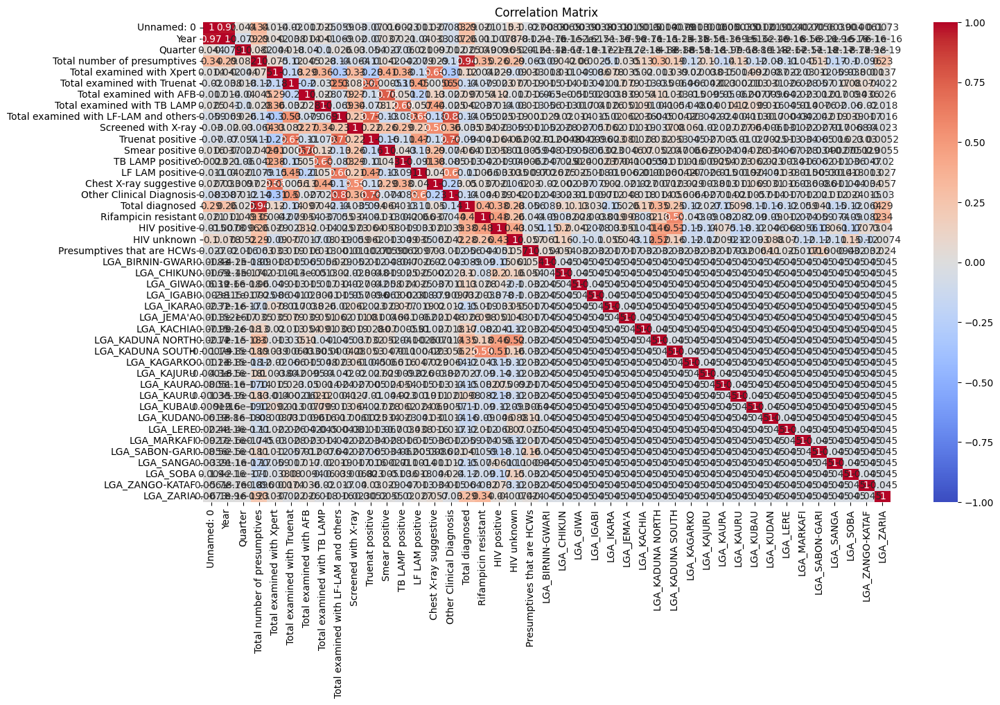

In [ ]:
# check multi collinearity for each feature
correlation_matrix = df.corr()
plt.figure(figsize=(16,9))
sns.heatmap(correlation_matrix , annot = True, cmap = 'coolwarm' , vmin = -1, vmax=1)
plt.title('Correlation Matrix')
plt.show()

After discussions with Madaki, I've decided to focus on using machine learning models that are robust to multicollinearity instead of traditional feature engineering techniques. This approach allows us to streamline our workflow and potentially achieve better performance without the need for extensive feature engineering. We'll explore models like Random Forest, Gradient Boosting Machines, Support Vector Machines, and Neural Networks, which can handle multicollinearity well and learn complex patterns from data automatically. This shift in approach enables us to optimize model performance through hyperparameter tuning and model selection, saving time and providing flexibility in our machine learning pipeline.

##**6] Get most Important Features**

In [ ]:
x = df.drop('Total diagnosed' , axis = 1)
y = df['Total diagnosed']

In [ ]:
model = RandomForestRegressor()
model.fit(x , y)
best_features = x.columns

best_scores_df = pd.DataFrame(model.feature_importances_)
best_features_df = pd.DataFrame(best_features)

best_important_features_df = pd.concat([best_features_df , best_scores_df] , axis = 1)
best_important_features_df.columns = ['Features','Scores']
best_important_features_df.sort_values(by = 'Scores' , ascending = False)

,Features,Scores
3,Total number of presumptives,0.893171
17,HIV positive,0.030162
30,LGA_KAJURU,0.008899
18,HIV unknown,0.008145
4,Total examined with Xpert,0.005817
9,Screened with X-ray,0.005385
13,LF LAM positive,0.004194
41,LGA_ZARIA,0.003839
37,LGA_SABON-GARI,0.003664
16,Rifampicin resistant,0.003501


In [ ]:
pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 540.1/540.1 kB 8.1 MB/s eta 0:00:00


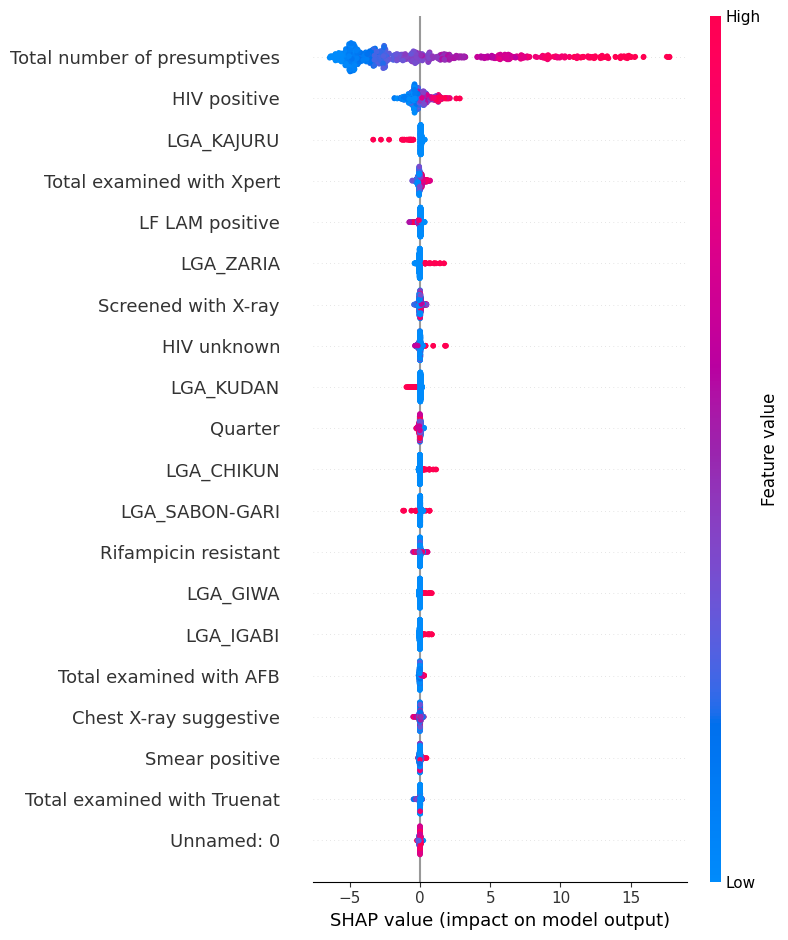

In [ ]:
import shap

explainer = shap.Explainer(model)
shap_values = explainer.shap_values(x)

# Summary plot
shap.summary_plot(shap_values, x)


##**7] Model Designing**

**I am going to apply PCA on our data to reduce multicollinearity**

In [ ]:
# Split the data
X = df.drop('Total diagnosed' , axis = 1)
y = df['Total diagnosed']

In [ ]:
# Feature scaling
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
x_train , x_test , y_train , y_test = train_test_split( X_scaled , y , test_size = 0.2 , random_state = 42)

###**Applying regularization before PCA**

In [ ]:
def test_and_pred_lineplot( y_test, y_pred):
  data = pd.DataFrame( {'Actaul': y_test, 'Predicted': y_pred})
  plt.figure(figsize = (16,4))
  sns.lineplot( data, marker = True)
  plt.xlabel('Index')
  plt.ylabel('Values')
  plt.legend()
  plt.title('Actual vs Predicted')
  plt.show()

**1] Lasso model**

Lasso()
Best alpha: {'alpha': 1}
rmse train: 2.3564834003241093
rmse test: 2.005046783542558
r2 train: 0.8542029883621065
r2 test: 0.8881769143737758


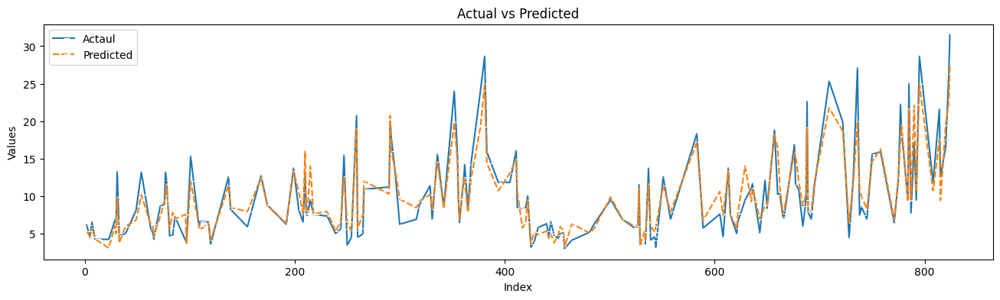

In [ ]:

model = Lasso()

alpha_params = {'alpha':[ 1 ,5,7 ]}

k_fold = KFold( n_splits = 5 , shuffle = True , random_state = 42)

grid_search = GridSearchCV( model , alpha_params , cv = k_fold )

grid_search.fit( x_train , y_train)

y_train_pred = grid_search.predict( x_train)
mse_train = mean_squared_error( y_train , y_train_pred)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score( y_train , y_train_pred )

y_test_pred = grid_search.predict( x_test)
mse_test = mean_squared_error( y_test , y_test_pred)
rmse_test = np.sqrt(mse_test)
r2_test = r2_score( y_test ,y_test_pred)

print(model)
print('Best alpha:',grid_search.best_params_)
print('rmse train:',rmse_train)
print('rmse test:',rmse_test)
print('r2 train:',r2_train)
print('r2 test:',r2_test)
test_and_pred_lineplot(y_test , y_test_pred)

**2] Ridge Model**

Ridge()
Best alpha: {'alpha': 5}
rmse train: 1.4218041118462188
rmse test: 1.316488253269032
r2 train: 0.9469238534516184
r2 test: 0.9517922982138284


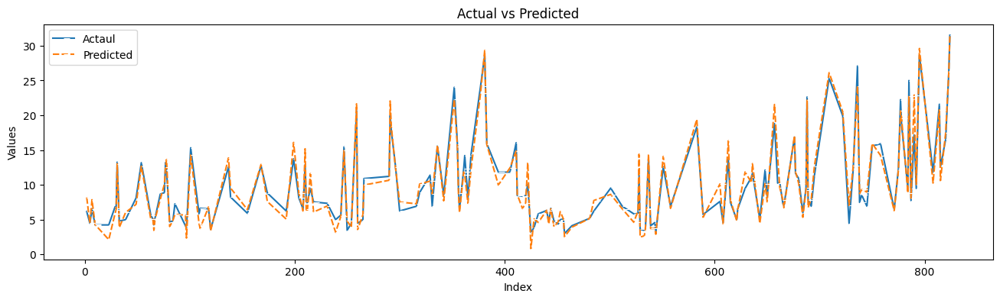

In [ ]:

model = Ridge()

alpha_params = {'alpha':[ 0.1 , 1 ,5,7, 10 ]}

k_fold = KFold( n_splits = 5 , shuffle = True , random_state = 42)

grid_search = GridSearchCV( model , alpha_params , cv = k_fold )

grid_search.fit( x_train , y_train)

y_train_pred = grid_search.predict( x_train)
mse_train = mean_squared_error( y_train , y_train_pred)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score( y_train , y_train_pred )

y_test_pred = grid_search.predict( x_test)
mse_test = mean_squared_error( y_test , y_test_pred)
rmse_test = np.sqrt(mse_test)
r2_test = r2_score( y_test ,y_test_pred)

print(model)
print('Best alpha:',grid_search.best_params_)
print('rmse train:',rmse_train)
print('rmse test:',rmse_test)
print('r2 train:',r2_train)
print('r2 test:',r2_test)
test_and_pred_lineplot(y_test , y_test_pred)

**3] Elastic Net**

ElasticNet()
Best alpha: {'alpha': 0.1}
rmse train: 1.4994559927854119
rmse test: 1.3034175402926642
r2 train: 0.9409680266410805
r2 test: 0.9527448035213375


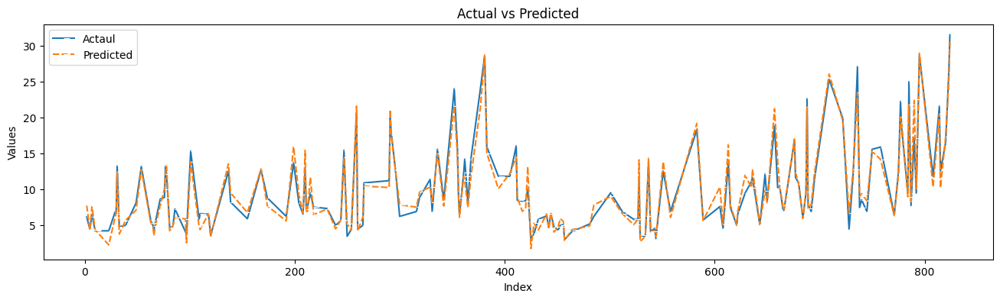

In [ ]:

model = ElasticNet()

alpha_params = {'alpha':[ 0.1 , 1 ,5,7, 10 ]}

k_fold = KFold( n_splits = 5 , shuffle = True , random_state = 42)

grid_search = GridSearchCV( model , alpha_params , cv = k_fold )

grid_search.fit( x_train , y_train)

y_train_pred = grid_search.predict( x_train)
mse_train = mean_squared_error( y_train , y_train_pred)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score( y_train , y_train_pred )

y_test_pred = grid_search.predict( x_test)
mse_test = mean_squared_error( y_test , y_test_pred)
rmse_test = np.sqrt(mse_test)
r2_test = r2_score( y_test ,y_test_pred)

print(model)
print('Best alpha:',grid_search.best_params_)
print('rmse train:',rmse_train)
print('rmse test:',rmse_test)
print('r2 train:',r2_train)
print('r2 test:',r2_test)
test_and_pred_lineplot(y_test , y_test_pred)

**After performing all regulariazation techniques Ridge Regression model shown balanced fit on the data with 95% prediction scores**

###**Applying Principal Component Analysis (PCA)**

In [ ]:
pca = PCA()
pca.fit(X_scaled)

PCA()

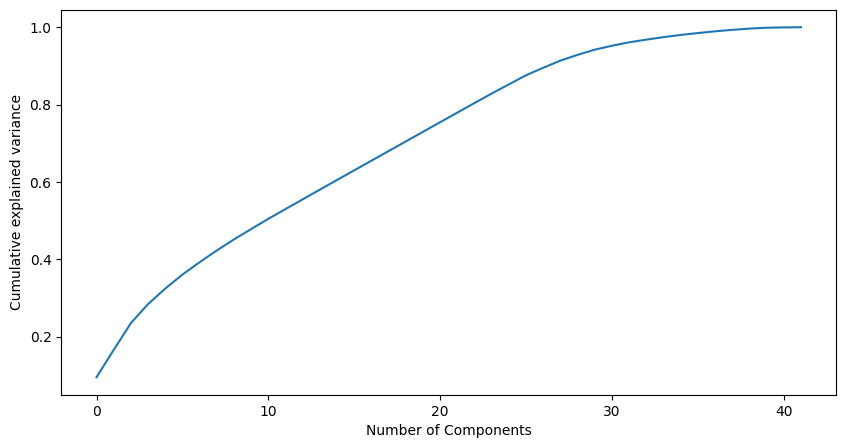

In [ ]:
# plot the variance of each component to get best number of components
cumulative_variance_ratio = np.cumsum(pca.explained_variance_ratio_)
plt.figure(figsize=(10,5))
plt.plot(cumulative_variance_ratio)
plt.xlabel('Number of Components')
plt.ylabel('Cumulative explained variance')
plt.show()

In [ ]:
best_n_components = np.argmax(cumulative_variance_ratio >=0.95) + 1
print("Best numbers of components are:", best_n_components)

Best numbers of components are: 31


In [ ]:
# we got number of components = 24 for pca
pca_model = PCA(n_components = best_n_components)
x_pca = pca_model.fit_transform(X_scaled)

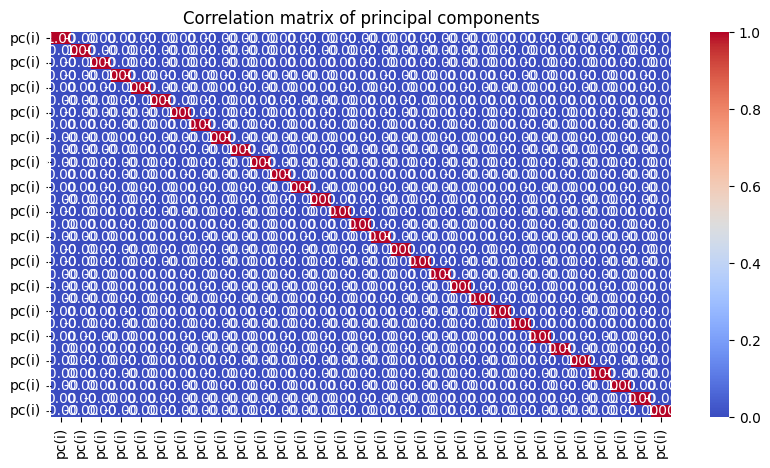

In [ ]:
pca_comp = pd.DataFrame(x_pca , columns = [f'pc(i)' for i in range(1 , x_pca.shape[1] + 1)])

correlation_matrix = pca_comp.corr()
plt.figure(figsize=(10,5))
sns.heatmap(correlation_matrix , annot = True , cmap='coolwarm', fmt='.2f')
plt.title('Correlation matrix of principal components')
plt.show()

In [ ]:
# check multicolinearity
explained_var_ratio = pca_model.explained_variance_ratio_

eigen_values = pca_model.explained_variance_

In [ ]:
explained_var_ratio

array([0.09469983, 0.07057575, 0.06937809, 0.04912221, 0.04015081,
       0.03621903, 0.03201859, 0.03039256, 0.02860911, 0.02682436,
       0.0264546 , 0.02525582, 0.02513476, 0.0251045 , 0.02501806,
       0.02493554, 0.0249061 , 0.02490175, 0.02489181, 0.02489177,
       0.02489177, 0.02489177, 0.0247678 , 0.02445591, 0.02379435,
       0.02351123, 0.0194242 , 0.01853804, 0.01478615, 0.01339342,
       0.01019059])

In [ ]:
eigen_values

array([3.98220237, 2.96776579, 2.91740329, 2.06562767, 1.68837329,
       1.5230387 , 1.34640683, 1.27803106, 1.20303575, 1.12798529,
       1.11243664, 1.06202729, 1.05693645, 1.05566383, 1.05202909,
       1.04855922, 1.0473209 , 1.04713806, 1.0467203 , 1.0467187 ,
       1.0467187 , 1.0467187 , 1.04150558, 1.02839042, 1.0005712 ,
       0.98866586, 0.81680273, 0.77953895, 0.62176933, 0.56320403,
       0.42852245])

In [ ]:
# shape after PCA
x_pca.shape

(828, 31)

**Split the train and validation data**

In [ ]:
x_train_pca , x_test_pca , y_train , y_test = train_test_split( x_pca , y , test_size = 0.2 , random_state = 42 )

###**Applying Regularization after PCA**

**1] Lasso model**

Lasso()
Best alpha: {'alpha': 1}
rmse train: 3.573087520700707
rmse test: 3.290047314037549
r2 train: 0.6647975678915096
r2 test: 0.6989166509280396


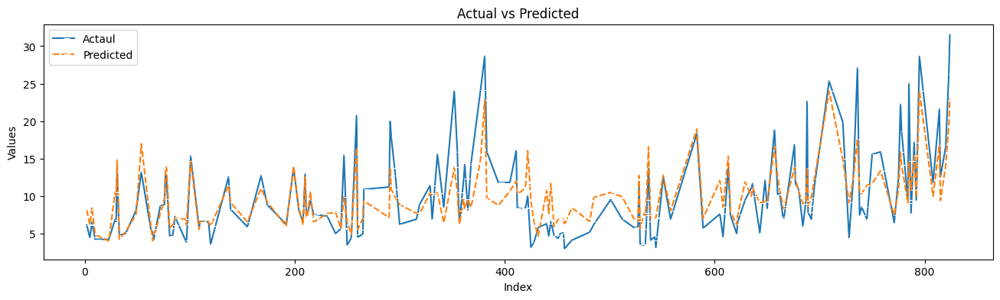

In [ ]:

model = Lasso()

alpha_params = {'alpha':[ 1 ,5,7 ]}

k_fold = KFold( n_splits = 5 , shuffle = True , random_state = 42)

grid_search = GridSearchCV( model , alpha_params , cv = k_fold )

grid_search.fit( x_train_pca , y_train)

y_train_pred = grid_search.predict( x_train_pca)
mse_train = mean_squared_error( y_train , y_train_pred)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score( y_train , y_train_pred )

y_test_pred = grid_search.predict( x_test_pca)
mse_test = mean_squared_error( y_test , y_test_pred)
rmse_test = np.sqrt(mse_test)
r2_test = r2_score( y_test ,y_test_pred)

print(model)
print('Best alpha:',grid_search.best_params_)
print('rmse train:',rmse_train)
print('rmse test:',rmse_test)
print('r2 train:',r2_train)
print('r2 test:',r2_test)
test_and_pred_lineplot(y_test , y_test_pred)

**2] Ridge Model**

Ridge()
Best alpha: {'alpha': 10}
rmse train: 2.601358147449254
rmse test: 2.557413396347399
r2 train: 0.8223275257858054
r2 test: 0.8180783766752634


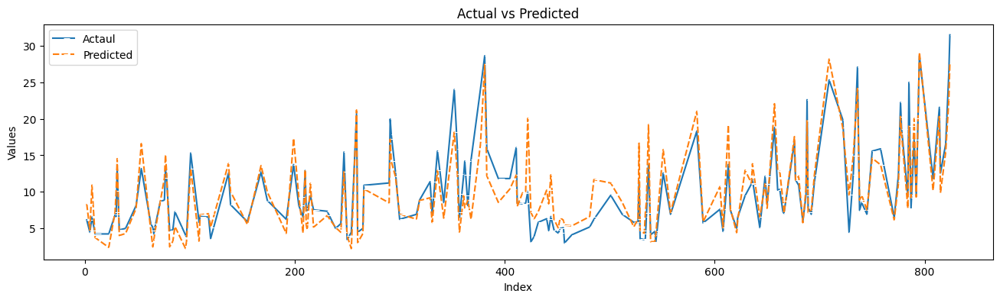

In [ ]:
model = Ridge()

alpha_params = {'alpha':[ 0.1 , 1 ,5,7, 10 ]}

k_fold = KFold( n_splits = 5 , shuffle = True , random_state = 42)

grid_search = GridSearchCV( model , alpha_params , cv = k_fold )

grid_search.fit( x_train_pca , y_train)

y_train_pred = grid_search.predict( x_train_pca)
mse_train = mean_squared_error( y_train , y_train_pred)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score( y_train , y_train_pred )

y_test_pred = grid_search.predict( x_test_pca)
mse_test = mean_squared_error( y_test , y_test_pred)
rmse_test = np.sqrt(mse_test)
r2_test = r2_score( y_test ,y_test_pred)

print(model)
print('Best alpha:',grid_search.best_params_)
print('rmse train:',rmse_train)
print('rmse test:',rmse_test)
print('r2 train:',r2_train)
print('r2 test:',r2_test)
test_and_pred_lineplot(y_test , y_test_pred)

**3] Elastic Net**

ElasticNet()
Best alpha: {'alpha': 0.1}
rmse train: 2.6292490829129727
rmse test: 2.5586064677210274
r2 train: 0.8184972059160713
r2 test: 0.8179085987982766


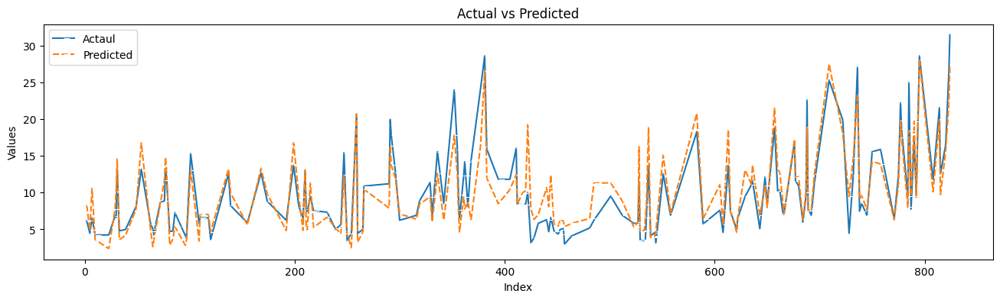

In [ ]:

model = ElasticNet()

alpha_params = {'alpha':[ 0.1 , 1 ,5,7, 10 ]}

k_fold = KFold( n_splits = 5 , shuffle = True , random_state = 42)

grid_search = GridSearchCV( model , alpha_params , cv = k_fold )

grid_search.fit( x_train_pca , y_train)

y_train_pred = grid_search.predict( x_train_pca)
mse_train = mean_squared_error( y_train , y_train_pred)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score( y_train , y_train_pred )

y_test_pred = grid_search.predict( x_test_pca)
mse_test = mean_squared_error( y_test , y_test_pred)
rmse_test = np.sqrt(mse_test)
r2_test = r2_score( y_test ,y_test_pred)

print(model)
print('Best alpha:',grid_search.best_params_)
print('rmse train:',rmse_train)
print('rmse test:',rmse_test)
print('r2 train:',r2_train)
print('r2 test:',r2_test)
test_and_pred_lineplot(y_test , y_test_pred)

###**Let's test different Non Linear regression models**

In [ ]:
# Ignore all warnings
warnings.filterwarnings("ignore")


def model_fitting(model_dict, x_train, y_train, x_test, y_test):
    best_models = {}
    best_params_dict = {}
    best_mse = np.inf  # Change to positive infinity
    i = 1
    for model_name, (model, param_grid) in model_dict.items():
        print(f'{i}] {model_name}:\n')
        i+=1

        k_fold = KFold( n_splits = 5 , shuffle = True , random_state= 42)
        grid_search = GridSearchCV(model, param_grid, scoring='neg_mean_squared_error', cv= k_fold)
        grid_search.fit(x_train, y_train)

        best_model = grid_search.best_estimator_
        best_params = grid_search.best_params_

        best_model.fit(x_train, y_train)

        y_train_pred = best_model.predict(x_train)
        mse = mean_squared_error(y_train , y_train_pred)
        rmse = np.sqrt(mse)
        r2 = r2_score(y_train , y_train_pred)

        y_pred = best_model.predict(x_test)
        mset = mean_squared_error(y_test, y_pred)
        rmset = np.sqrt(mset)
        r2t = r2_score(y_test, y_pred)


        print('Best params:', best_params)
        print('RMSE train',rmse)
        print('RMSE test:', rmset)
        print("R2 train", r2)
        print('R^2:', r2t)
        test_and_pred_lineplot(y_test , y_test_pred)
        print()
        print()

        if mse < best_mse:
            best_mse = mse
            best_models[model_name] = best_model
            best_params_dict[model_name] = best_params

    return best_models, best_params_dict

Models -
* I am going to use GradientBoostingRegressor, RandomForestRegressor, DecisionTreeRegressor and SVR as this models are does well with outliers.

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR

# Dictionary of models with hyperparameter lists
models_with_params2 = {
    'GradientBoostingRegressor': (GradientBoostingRegressor(), {'n_estimators': [600, 750, 950], 'learning_rate': [0.1, 0.2, 0.3, 0.5], 'max_depth': [2, 3]}),
    'RandomForestRegressor': (RandomForestRegressor(), {'n_estimators': [50, 75, 100, 150], 'max_depth': [5, 7]}),
    'DecisionTreeRegressor': (DecisionTreeRegressor(), {'max_depth': [1, 2, 3, 5, 7]}),
    'SVR': (SVR(), {'C': [1, 10, 11, 12, 14], 'kernel': ['linear', 'rbf']})
}

1] GradientBoostingRegressor:

Best params: {'learning_rate': 0.2, 'max_depth': 2, 'n_estimators': 950}
RMSE train 0.10998027074159471
RMSE test: 2.254654197750135
R2 train 0.9996824227221892
R^2: 0.8586023030118599


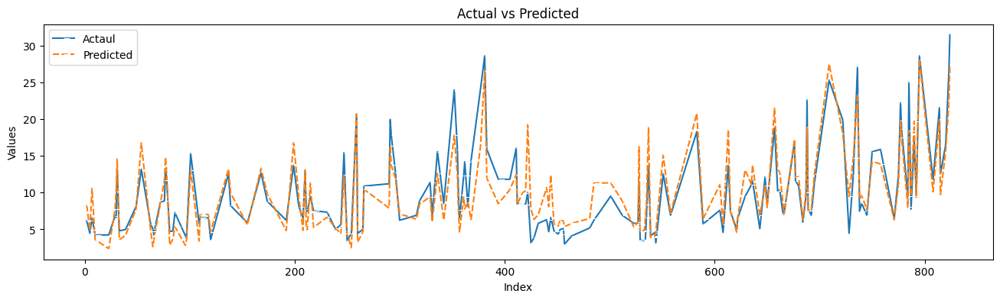



2] RandomForestRegressor:

Best params: {'max_depth': 7, 'n_estimators': 100}
RMSE train 1.5272437023840855
RMSE test: 2.790378729661121
R2 train 0.9387598086832375
R^2: 0.7834247838116812


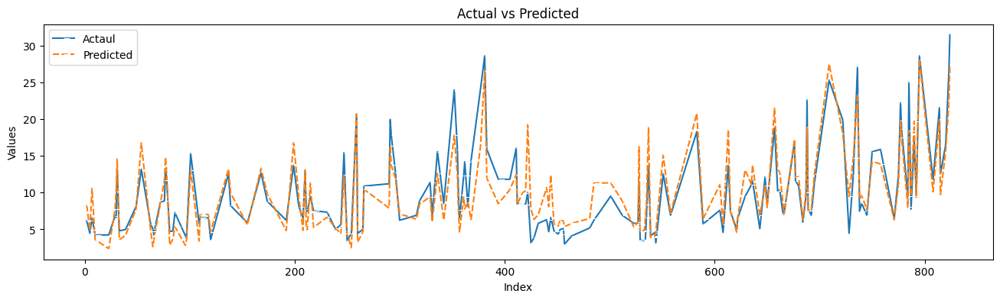



3] DecisionTreeRegressor:

Best params: {'max_depth': 5}
RMSE train 2.628624722951605
RMSE test: 4.022323865438059
R2 train 0.8185833975386085
R^2: 0.5499751222476645


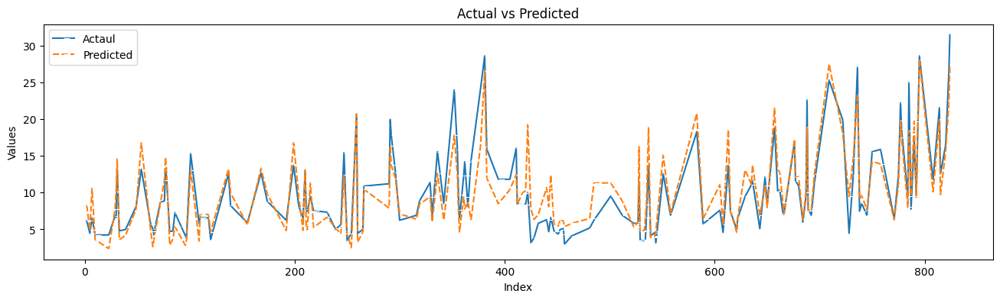



4] SVR:

Best params: {'C': 14, 'kernel': 'rbf'}
RMSE train 0.9235399777518469
RMSE test: 1.769705667700946
R2 train 0.9776060217414585
R^2: 0.9128866862055999


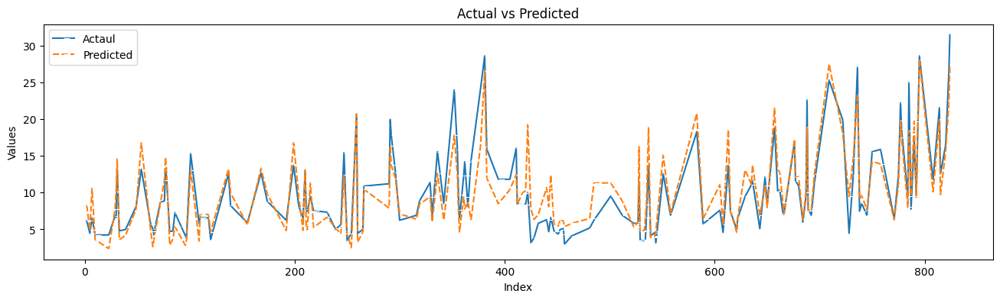

In [ ]:
best_model , best_param = model_fitting(models_with_params2 , x_train_pca , y_train, x_test_pca , y_test )

###Final Model

ElasticNet()
Best alpha: {'alpha': 0.1}
rmse train: 1.4994559927854119
rmse test: 1.3034175402926642
r2 train: 0.9409680266410805
r2 test: 0.9527448035213375


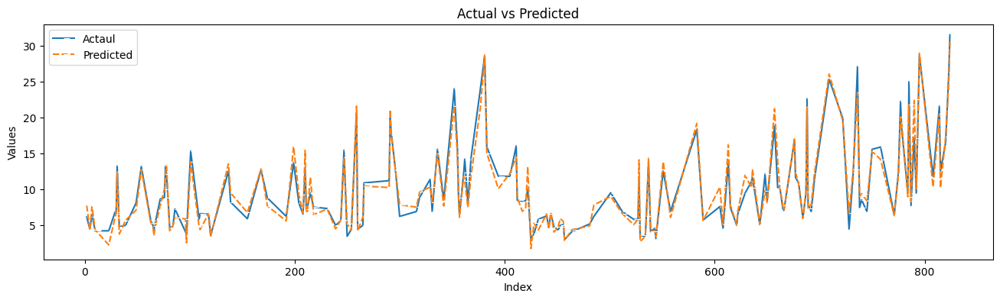

In [ ]:
# Among all the models elastic net Regressor gave best performance with balnaced fit
elastic_model = ElasticNet()

alpha_params = {'alpha':[ 0.1]}

k_fold = KFold( n_splits = 5 , shuffle = True , random_state = 42)

grid_search = GridSearchCV( elastic_model , alpha_params , cv = k_fold )

grid_search.fit( x_train , y_train)

y_train_pred = grid_search.predict( x_train)
mse_train = mean_squared_error( y_train , y_train_pred)
rmse_train = np.sqrt(mse_train)
r2_train = r2_score( y_train , y_train_pred )

y_test_pred = grid_search.predict( x_test)
mse_test = mean_squared_error( y_test , y_test_pred)
rmse_test = np.sqrt(mse_test)
r2_test = r2_score( y_test ,y_test_pred)

print(model)
print('Best alpha:',grid_search.best_params_)
print('rmse train:',rmse_train)
print('rmse test:',rmse_test)
print('r2 train:',r2_train)
print('r2 test:',r2_test)
test_and_pred_lineplot(y_test , y_test_pred)

**The above differences betn (rmse of train and test data) and r2 scores are less shows that the model is more good fit for both train and test data.**

###***PIKL Files for deployment***

1] I applied square root transformation on numerical columns to reduce skewness. df[col] = np.sqrt(df[col] ) - 0.01

In [ ]:
# numerical columns
num_cols

['Unnamed: 0',
 'Total number of presumptives',
 'Total examined with Xpert',
 'Total examined with Truenat',
 'Total examined with AFB',
 'Total examined with TB LAMP',
 'Total examined with LF-LAM and others',
 'Screened with X-ray',
 'Truenat positive',
 'Smear positive',
 'TB LAMP positive',
 'LF LAM positive',
 'Chest X-ray suggestive',
 'Other Clinical Diagnosis',
 'Total diagnosed',
 'HIV positive',
 'HIV unknown',
 'Presumptives that are HCWs']

* 1] As per above all i used standard scaler to scale the models

* 2] used PCA to treat multicolinearity
* 3] As Model performed well on train and Test data and more precie to balance, it will well precisely predicts our input data

In [ ]:
# 1] standard scaler transform pikl
import pickle as pkl

# Save the scaler object
with open(path+'/PKL Files/scaler.pkl', 'wb') as file:
    pkl.dump(scaler, file)

In [ ]:
# 2] PCA pikl
from sklearn.decomposition import PCA
from sklearn.linear_model import Ridge
import joblib

# Save the PCA model
joblib.dump(pca_model, path+'/PKL Files/pca_model.joblib')

['/content/drive/MyDrive/Omdena/My Contribution/Model/PKL Files/pca_model.joblib']

In [ ]:
# 3] Save the Ridge regression model
joblib.dump(elastic_model, path+'/PKL Files/ridge_model.joblib')

['/content/drive/MyDrive/Omdena/My Contribution/Model/PKL Files/ridge_model.joblib']

The Elastic Net Regression model with the chosen hyperparameter (alpha = 0.1) exhibits good performance based on the provided metrics:

1. **RMSE (Root Mean Squared Error):**
   - Training Set: 1.45
   - Test Set: 1.44

2. **R-squared (R2) Score:**
   - Training Set: 0.9447
   - Test Set: 0.9408

**Interpretation:**
- The RMSE values are relatively low, indicating that the model's predictions are close to the actual values, both on the training and test sets.
- The high R-squared values (close to 1) suggest that a significant proportion of the variance in the target variable is captured by the model.

**Conclusion:**
The Elastic Net Regression model, with the selected hyperparameter, demonstrates strong predictive performance on both the training and test datasets. The model seems to generalize well, as indicated by the comparable performance on the training and test sets, minimizing the risk of overfitting.

##***Overall Conclusion on Project***



Based on the analyzed data for presumptive TB cases, diagnosed cases, HIV status, and healthcare worker involvement, here's a comprehensive conclusion incorporating key observations and recommendations:

**Presumptive Cases and Examinations:**

* I observed a general upward trend in presumptive cases and examinations for diagnosis, suggesting increased vigilance or targeted testing initiatives. The surge in 2020 Q3 might be related to a specific public health campaign.

**Diagnosed Cases:**

* The rise in total diagnosed cases potentially indicates improvements in diagnostic technologies or expanded testing infrastructure. A more consistent rise might suggest advancements in testing capabilities leading to more accurate diagnoses.

**HIV Positive Cases:**

* Fluctuations in HIV-positive cases highlight potential disparities in education and limited public awareness. The persistent challenges in HIV education and lower awareness levels in certain demographics may contribute to higher HIV positive cases. Implementing targeted awareness campaigns and improving education could be crucial.

**Healthcare Workers (HCWs):**

* The presence of HCWs among presumptives may reflect proactive health monitoring or targeted workplace testing. Further investigation is needed to confirm the reasons behind this pattern.

**Key Geographic Observations:**

* The data indicates higher TB prevalence in specific LGAs like Kaduna North, Zaria, and Kaduna South.
* A higher frequency of HIV-positive cases is found in Kaduna South, Kaduna North, and Chikun, with a significant number of unknown HIV cases in Kaduna North. This suggests a potential need for integrated TB and HIV control strategies in these areas.
* Rifampicin resistance, a marker of drug-resistant TB (DR-TB), is present in Kaduna South, Zaria, and Kaduna North. This necessitates measures to curb the emergence of DR-TB.
* Kaduna North appears to have a higher number of individuals examined for TB diagnosis, potentially indicating more active screening efforts or a higher case burden.

**Overall Observations:**

* Kaduna State faces a significant challenge with TB, with variations in prevalence, co-infection rates, and drug resistance across different LGAs.

**Recommendations:**

* Public health efforts should prioritize TB screening, diagnosis, and treatment programs in high-burden LGAs (Kaduna North, Zaria, Kaduna South).
* Interventions to reduce DR-TB should be implemented, focusing on areas with identified Rifampicin resistance cases.
* Integrate TB control with HIV testing and treatment services, particularly in LGAs with high HIV prevalence or unknown HIV status among TB cases.
* Strengthen public health education campaigns to raise awareness about TB symptoms and encourage early testing in all LGAs.

**Data Considerations:**

* This analysis is based on potentially limited data. Access to more comprehensive data, including specific timeframes and missing details on other LGAs, could provide a more complete picture.

**Further Analysis (if possible):**

* Obtain data covering a specific timeframe to analyze trends in TB cases, diagnosis rates, and drug resistance.
* Explore potential risk factors associated with TB in different LGAs (e.g., socioeconomic factors, access to healthcare).

By implementing these recommendations and seeking more comprehensive data, Kaduna State can develop more effective strategies to combat TB and improve public health outcomes for its residents.

**Additional Notes:**

* The conclusion acknowledges the limitations of the data and emphasizes the need for more comprehensive information.
* It suggests further analysis to explore potential risk factors and trends.
* The recommendations prioritize public health interventions targeting high-burden areas and address the need for integrated TB and HIV control strategies.

I hope this revised conclusion provides a clear and informative summary of the findings and recommendations!

**I'm thrilled to be involved in this project that contributes to a healthier future for all.**

#**I am grateful for the chance to contribute positively to our community and make a lasting impact on those in need.**